<a id='000-0'></a>
<center><h1>Privacy for Geolocation</h1></center>

<center>Raphael Thesmar, Joseph Thesmar, Rafael G. L. D'Oliveira, and Muriel Médard</center>
<center>Belmont High-school, USA</center>
<center>RLE, Massachusetts Institute of Technology, USA</center>
<center>Emails: rft38@cornell.edu, jpthesmar@wpi.edu, {rafaeld, medard}@mit.edu</center>

## Abstract

This notebook is a companion to our [paper of the same title]. We show how to reproduce our experimental results and how to run your own. Our presentation in this notebook aims to be as accesible and self contained as possible, leaving theoretical details to our paper.

We consider the problem of privately aggregating mobile users' locations on a city map. This setting involves a single (potentially untrusted) server and multiple users, each having a list of visited locations. The scheme we propose, named Cabdriver, works by randomly distorting a user's input so that the output is (approximately) statistically indistinguishable from a uniformly random one. This guarantees, in particular, that Cabdriver is [locally differentially private](https://en.wikipedia.org/wiki/Local_differential_privacy). Despite the outputs appearing uniformly distributed, after aggregating the data from all users, the server is able to obtain an estimate for the amount of times each location has been visited. These estimates are used to build a heat map of visited locations. 

Moreover, we show that by means of a threshold operation, one can, with high probability, remove all false positives -- essentially the noise -- from the heat map while retaining locations which have been visited by more than a square root of the amount of users. We showcase Cabdriver by running it on location data from the [NYC Taxi and Limousine Commission (TLC) trip records dataset](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page). This dataset includes over a billion entries each including the pick-up and drop-off locations of taxi trips in New York City.

## Table of Contents
* [Introduction](#000-1)
* [Packages](#000-2)
    * [Pandas](#001)
    * [Ipyleaflet](#002)
    * [Numpy](#003)
    * [Datashader, Geoviews, Holoviews and Bokeh](#004)
    * [Matplotlib](#005)
* [Introducing the Dataset](#000-52)
    * [Loading the TLC Dataset into the Notebook](#000-521)
    * [Graphing the Data](#000-522)
* [Privacy Definition](#000-3)
* [Concentration Inequalities](#000-4)
* [Partitioning the Data and the Map into Disjoint Regions](#000-5)
    * [Partitioning the Map](#000-51)
    * [Partitioning the Data](#000-53)
        * [Partitioning](#000-531)
        * [Graphing matrices](#000-532)
* [CABDRIVER Scheme](#000-6)
    * [Private Scheme](#000-61)
    * [Graphing Our Results](#000-62)
* [Privacy Analysis](#000-7)
* [Performance Analysis](#000-8)

<a id='000-1'></a>
## Introduction


Location based services bring many benefits to their users. These include ridesharing ([Uber](https://www.uber.com/)), entertainment ([Pokemon Go](https://pokemongolive.com/en/)), and finding locations of interest near the users ([Google Maps](https://www.google.com/maps)). These services, however, raise large privacy concerns; many users do not like the idea of being constantly tracked. Indeed, around $54\%$ of Americans polled by the [Pew Research Center](https://www.pewresearch.org/wp-content/uploads/2020/04/Topline-COVID-cellphones.pdf) thought it was unacceptable for the government
to use cellphones to track the location of people for the purposes of contact tracing for mitigating the spread of COVID-19. 


We consider securely aggregating taxi pick-up and drop-off locations in order to obtain a heat map of visited locations. It is known that simple anonymyzation techniques, like simply removing labels from the data are not sufficient. Indeed, in [research conducted by the University of Chicago Booth School of Business](https://www.chicagobooth.edu/media-relations-and-communications/press-releases/how-nyc-taxi-ride-data-suggest-cozy-relationship-between-big-banks-and-the-fed) it was shown that "anonymous" New York City yellow taxi records (the [TLC dataset](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page)) could be used to infer variation in interactions between insiders of the Federal Reserve Bank of New York and insiders of major commercial banks around Federal Open Market Committee meetings.     

In the [companion paper] to this notebook, we present a scheme which privately outputs a heat map of visited locations. The scheme is called Cabdriver and works by randomly distorting the users data so that the information the user shares is (approximately) statistically indistinguishable from a uniformly random one. This guarantees, in particular, that Cabdriver is [locally differentially private](https://en.wikipedia.org/wiki/Local_differential_privacy). Despite the information shared by the users appearing uniformly distributed, after aggregating the data from all users, one can obtain an estimate for the amount of times each location has been visited, or equivalently, an estimated heat map for the visited locations.



In [16]:
from IPython.display import Image
from panel.widgets import DiscreteSlider
import panel as pn
import param
import math

In [17]:
pn.extension()

GridSpec(sizing_mode='fixed', width=950)
    [0] Column(background='WhiteSmoke', height=120, width=474)
        [0] Markdown(str)
        [1] DiscreteSlider(formatter='%d', name='threshold', options=[15583, 15938, ...], value=15583)
    [1] Column(height=120, width=474)
        [0] Markdown(str)
        [1] Column
            [0] Column()
            [1] Row
                [0] Str(str)
    [2] Column(height=480, width=948)
        [0] ParamFunction(function)
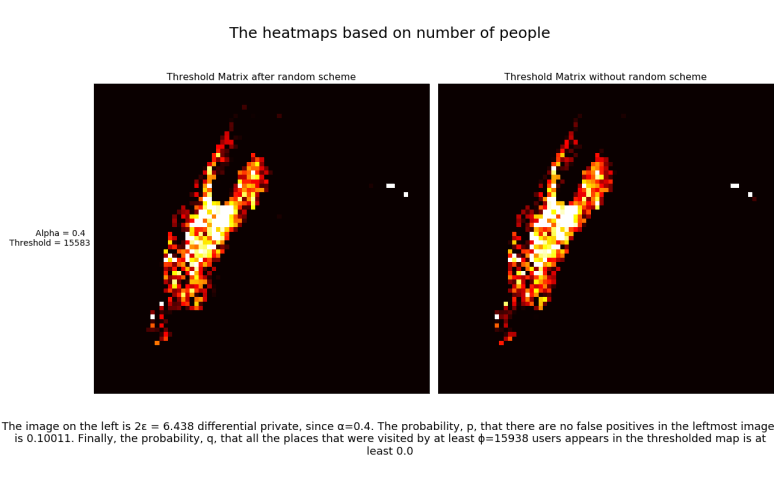

In [31]:
# Baby slider 1
threshold = pn.widgets.DiscreteSlider(name='threshold', options=[15583,15938,16220,16481,16743,17025,17351,17769,18415,25395], value=15583)

@pn.depends(threshold.param.value)
def graphData(threshold):
    return Image(filename=f'img/babySlider1/heatThresh{threshold}.png')

def getText():
    return pn.pane.Str('Add text here')

gspec = pn.GridSpec(width=950, height=600)
gspec[0,    :2  ] = pn.Column('### Inputs', threshold, background="WhiteSmoke")
gspec[0,   2:4] = pn.Column('### Privacy', getText, margin=0)
gspec[1:5,   :] = pn.Column(graphData)

gspec

GridSpec(sizing_mode='fixed', width=950)
    [0] Column(background='WhiteSmoke', height=120, width=474)
        [0] Markdown(str)
        [1] IntSlider(end=50, name='User #', start=1, value=1)
    [1] Column(height=120, width=474)
        [0] Markdown(str)
        [1] Column
            [0] Column()
            [1] Row
                [0] Str(str)
    [2] Column(height=480, width=948)
        [0] ParamFunction(function)
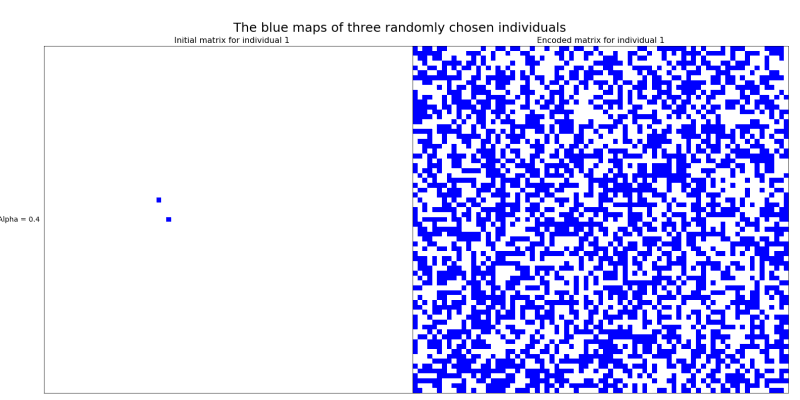

In [38]:
# Baby slider 2
x = pn.widgets.IntSlider(name='User #', start=1, end=50, step=1, value=1)

@pn.depends(x.param.value)
def graphData(x):
    return Image(filename=f'img/babySlider2/indBA{x}.png')

def getText():
    return pn.pane.Str('Add text here')

gspec = pn.GridSpec(width=950, height=600)
gspec[0,    :2  ] = pn.Column('### Inputs', x, background="WhiteSmoke")
gspec[0,   2:4] = pn.Column('### Note', getText, margin=0)
gspec[1:5,   :] = pn.Column(graphData)

gspec

<a id='000-2'></a>

## Packages
The main Libraries we use on our project and on the notebook are: *[pandas](https://pandas.pydata.org/)*, *[datashader](https://datashader.org/)*, *[geoviews](https://geoviews.org/)*, *[holoviews](https://holoviews.org/)*, *[numpy](https://numpy.org/)* and *[matplotlib](https://matplotlib.org/)*. However, we also use smaller libraries like *[ipyleaflet](https://ipyleaflet.readthedocs.io/en/latest/)*, *[csv](https://docs.python.org/3/library/csv.html)*, *[os](https://docs.python.org/3/library/os.html)*, *[bokeh](https://docs.bokeh.org/en/latest/index.html)*, *[math](https://docs.python.org/3/library/math.html)*, *[IPython](https://ipython.org/)*, *[ipywidgets](https://ipywidgets.readthedocs.io/en/latest/)*, *[panel](https://panel.holoviz.org/)* and *[param](https://param.holoviz.org/)*. 

&emsp; While we use pandas with a few other libraries to load the data into dataframes, we map the points using Ipyleaflet and folium. However, mapping millions of points on Ipyleaflet leads to long run time and laggy maps. We thus use datashader  with geoviews, holoview, and bokeh  to plot millions of points. We then used numpy to apply the concepts of k-anonymity and differential privacy on our data (more on that later). Matplotlib also came in helpful to plot interesting graphs using data on k-anonimity and influence (again more on that later).


**To install all the libraries**:
*   ipyleaflet - *pip install ipyleaflet*
*   geoviews - *pip install geoviews*
*   datashader - *pip install datashader*
*   pandas - *pip install pandas*
*   numpy - *pip install numpy*
*   holoviews - *pip install holoviews*
*   matplotlib - *pip install matplotlib*
*   bokeh - *pip install bokeh*
*   IPython - *pip install IPython*
*   panel - *pip install panel*
*   param - *pip install param*
*   ipywidgets - *pip install ipywidgets*

<a id='001'></a>
### &emsp;1. [Pandas](https://pandas.pydata.org/)
  Pandas is a fast and powerful library used for data manipulation and analysis. It provides data structures and operations to manipulate dataframes. 
  We use Pandas to transfer the taxi trip data(the pickup and dropoff latitudes and longitudes) from each trip, which are located in a .csv file, into pandas dataframes. 
  
<br>

Importing the library in the notebook:
* *import pandas as pd* 


Pandas commands we use:
* *pd.DataFrame({})* - We use this to create a dataframe for the individuals coordinates
* *pd.concat(list_of_dataframes)* - We use this to combine certain dataframes together
* *dfName[column name]* - This was use in order to access a full column
* *dfName.loc[number]* - We use this to find the number of times the index of a row=number
* *dfName.index* - We use this to get a list of all the indices of the dataframe
* *df = df[df['X'] < bound]* - This commands removes all the rows within df where 'X' is more than 'bound' and updates df. Notice that the '<' can be changed to '>' 

<h4><center>Example of pandas comand we used:</center></h4>

In [ ]:
# This was used in order to import pandas in our notebook
import pandas as pd

In [ ]:
#We use the following format to create 2 data frames with x and y columns
df1 = pd.DataFrame({
    'x': [1,2,3,4,5],
    'y': [4,3,2,1,0]
})
df2 = pd.DataFrame({
    'x':[4,3,2,1,0],
    'y':[1,2,3,4,5]
})
#printing the first dataframe
df1

In [ ]:
#To access the 'x' column within the df1 dataframe
df1['x']

In [ ]:
#In the following command we retrieve the 'x' and the 'y' at index=1. We could change this 1 to any other number 
df1.loc[1]

In [ ]:
#We can combine the dataframes df1 and df2(in df3) by using the following comand: 
df3 = pd.concat([df1,df2])
#printing df3
df3

In [ ]:
#When combining the dataframes into one, we forget to reset the index to 0-9. The following command could be useful in this case
#as it prints back the list of the indices
df3.index

In [ ]:
#The next code removes all the rows where 'x'>=3 from df3. We could change 'x' to 'y' and the 3 to any other number.
df3[df3['x']<3]

<a id='002'></a>
### &emsp;2. [Ipyleaflet](https://ipyleaflet.readthedocs.io/en/latest/) 
Ipyleaflet is an interactive library that uses ipywidgets. The library allows us to create interactive maps and draw paths, points. The downside of this library is that it struggles to plot more than 10,000 points thus, we also use datashader, holoviews and geoviews than can manage up to billions of points. The library works with the [latitude, longitude] coordinate system.

<br>

Importing the library in the notebook:
 - *from ipyleaflet import* * 

Ipyealflet Commands we use:
 - *map = Map(center=(lat, lon), zoom =5)* - This command creates a map centered at lat, lon.
 - *lines = Polyline(locations = locations,  color = "black", fill = False)* - This creates a line which goes through each coordinate from the "locations" list. The lines will be black. If a list of list of coordinates is given it will create a different line for each list within the list "locations".
 - *map.add_layer(object)* - When we have created the points, the heatmap or the lines, we need do draw them on the map. To do so, we add a layer and the object is what we want to draw(points, lines, heatmap, etc..)

In [5]:
#importing ipyleaflet
from ipyleaflet import *
#importing random as we need it later in our code to create a heatmap
import random

In [14]:
#creating a map with ipyleafet
m1 = Map(center = (0,0), zoom=5)

In [15]:
#Here we show the ipyleaflet map, my just writing 'm1'
m1

Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [16]:
#creating 3 markers at [0,0] [1,1] [0,2] and putting them in a cluster before adding them to the ipyleaflet map
marker1 = CircleMarker(location=(0,0), radius = 1, color="red", fill_color="red")
marker2 = CircleMarker(location=(1,1), radius = 1, color="red", fill_color="red")
marker3 = CircleMarker(location=(0,2), radius = 1, color="red", fill_color="red")
# Creating the cluster
marker_cluster = MarkerCluster(
        markers=(marker1, marker2, marker3)
)
m1.add_layer(marker_cluster)
#showing the ipyleaflet map
m1

Map(bottom=4296.0, center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

<a id='003'></a>
### &emsp;3. [Numpy](https://numpy.org/)
Numpy is a very powerfull python libraries that provides structural support for large, multi-dimensional arrays and matrices as well as complex math operations to opperate on these arrays and matrices. We use numpy to create huge 2-D arrays when we discretize the space around the New York area, more on that later.

<br>

Importing the library in the notebook:
* *import numpy as np* 

Numpy commands we use:
*  *np.zeros((n, m), dtype=int)* - We use this to create a 2-D numpy matrix which has 'n' rows and 'm' columns and only accepts integers values. The initial values of all cells is 0.
* *np.nonzero(2D_mat)* - This command takes a numpy2D-matrix and returns a 2-D arrays, one with all the i-indices where the matrix has an element not equal to 1 and the other with all the j-indices where the matrix has an elemt not equal to 1. We can then combine the two arrays and create a list with all the (i,j) where mat[i][j]!=0
* *np.ones((n, m), dtype=int)* - We use this to create a 2-D numpy matrix which has 'n' rows and 'm' columns and only accepts integers values. The initial values of all cells is 1.
* *np.uint8, np.uint16, np.int8* - These are some of the datatypes numpy provides which are the same as unsigned int8, unsigned int16 and int8 in C/C++. 
* *np.arange(start, end, interval)* - This function generates values within the half-open interval [start, end) (in other words, the interval including start but excluding stop) similarly to the range function in python.

In [10]:
#importing numpy 
import numpy as np
#importing random for later
import random

In [18]:
#we create a 5 by 5 np matrix full of ones using numpy
mat = np.ones((5,5), dtype=int)
#printing the matrix
mat

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]])

In [19]:
#we create a 5 by 5 np matrix full of zeros using numpy
mat = np.zeros((5,5), dtype=int)
#printing the matrix
mat

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]])

In [24]:
#We take 2 random 0s in the matrix and turns them into 1
mat[random.randrange(0,5)][random.randrange(0,5)]=1
mat[random.randrange(0,5)][random.randrange(0,5)]=1
#printing the updated matrix
mat

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0]])

In [ ]:
#Using np, we are able to get all the indices where the matrix is not equal to 0 and we store them in indices. The output is a 
#tuple of list, where the first list is the lists of'i' while the second is the lists of 'j' where mat[i][j]!=0.
indices = np.nonzero(mat)
#Putting the indices in the format of a list of tuples where each tuples are (i,j)
l = list(zip(indices[0], indices[1]))
l

In [27]:
# Using the np.arange function, we generate  and print a numpy array that starts at 0.1 and finishes before 10 with steps 
# of size 0.4.
l = np.arange(0.1, 10, 0.4)
l

array([0.1, 0.5, 0.9, 1.3, 1.7, 2.1, 2.5, 2.9, 3.3, 3.7, 4.1, 4.5, 4.9,
       5.3, 5.7, 6.1, 6.5, 6.9, 7.3, 7.7, 8.1, 8.5, 8.9, 9.3, 9.7])

<a id='004'></a>
### &emsp;4. [Datashader](https://datashader.org/), [Geoviews](https://geoviews.org/), [Holoviews](https://holoviews.org/) and [Bokeh](https://docs.bokeh.org/en/latest/index.html)

Datashader is a library used for visualizing large datasets and anylizing them. Precisely, it aggregates into grids that can be viewed in images and makes the plotting process much more efficient. Combining the Geoviews, Holoviews, and bokeh libraries with datashader we map the 10 million points on an interactive map in less than a second.

<br>

Importing the libraries in the notebook:
* *import datashader as ds*
* *import geoviews as gv*
* *import holoviews as hv*
* *import datashader.transfer_functions as tf*
* *from holoviews.operation.datashader import datashade, dynspread*

Command we use:
1. Changing the coordinate system of the dataframe 'df' from longitude, latitude to the x,y coordinates that geoviews, holoviews and datashader use.
 * *arr = ds.utils.lnglat_to_meters(df['longitude'], df['latitude'])*- This command returns an arrays consisting of two subarrays, the first one(at index 0), being the new "X" coordinates and the second one(at index 1), the new "Y" coordinates. We then have to assign them to new columns of the dataframe by writing: *df["X"]=arr[0]* and *df["Y"]=arr[1]*.
2. Creating an interactive map with the libraries
 * *geomap = gv.tile_sources.OSM.opts(width=500, height=300)* - This command uses geoviews to create a tile map
 * *points = hv.Points(gv.Dataset(df, kdims = ['X', 'Y']))* - This command combines geoviews with holoviews to take all the points with 'X' and 'Y' coordinates which are inside the 'df' dataframe and create the points.
 * *agg = dynspread(datashade(points, color_key = fire, element_type= gv.Image, aggregator = ds.count()))* - This command uses holoviews with datashader in order to create an interactive image which can then be supperposed with the geoviews map to create the final product
 * *agg* * *geomap* - This supperposes the aggregated points with the geoviews map and created the final product
3. Creating a plot of the New York area and the data
 * *cv = ds.Canvas(plot_width=600, plot_height=524,x_range=x_range,y_range=y_range)* - This datashader command creates a blank canvas with width=600, heigh=524 and with data range of x_range and y_range
 * *agg = cv.points(df, 'X', 'Y')* - This other datashader command uses the canvas created previously and creates the points (X,Y) from the df dataframe.
 * *tf.set_background(tf.shade(agg, cmap=fire),"black")* - This command sets the background of the canvas black and plots the points created previously following a certain colormap called fire.
 * In order to import the fire colormap, it is necessary to run this line:
    - *from colorcet import fire* 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
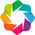

In [28]:
#With the following lines, we hope to import the necessary datashader, geoviews, holoviews and set the bokeh extensions
import datashader as ds
import geoviews as gv
import holoviews as hv
from datashader import transfer_functions as tf
from holoviews.operation.datashader import datashade, dynspread

hv.notebook_extension('bokeh')

#we also import pandas because we use later in the code 
import pandas as pd

#we also import the fire colormap as we use it when graphing our points
from colorcet import fire

In [45]:
#We will first be changing a dataset that uses longitude, latitudes to the x,y coordinates that geoviews, datashader and 
#holoviews are use
dataset = pd.DataFrame({
    'longitude': [random.uniform(-74.1,-73.85) for i in range(100000)],
    'latitude': [random.uniform(40.67, 40.83) for i in range(100000)]
})
o = ds.utils.lnglat_to_meters(dataset['longitude'], dataset['latitude'])
dataset['X'] = o[0]
dataset['Y'] = o[1]
#printing the dataset table to se can see the changes that have been made
dataset

,longitude,latitude,X,Y
0,-74.080649,40.727182,-8.246620e+06,4.972184e+06
1,-73.983680,40.792534,-8.235826e+06,4.981788e+06
2,-73.919637,40.713025,-8.228696e+06,4.970105e+06
3,-74.055921,40.773501,-8.243867e+06,4.978990e+06
4,-74.099068,40.748279,-8.248671e+06,4.975283e+06
...,...,...,...,...
99995,-74.081505,40.684281,-8.246715e+06,4.965884e+06
99996,-74.047479,40.690360,-8.242928e+06,4.966777e+06
99997,-73.851819,40.685382,-8.221147e+06,4.966046e+06
99998,-74.005330,40.773145,-8.238236e+06,4.978938e+06


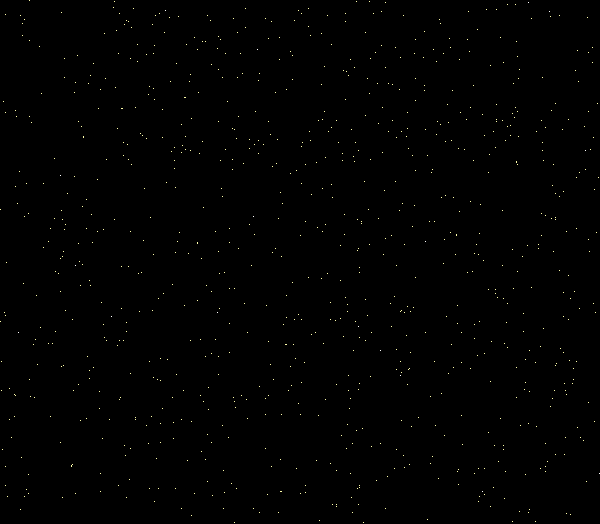

In [50]:
#Now we will be ploting the point on a static black background. Because we got the points using a random function the plot will 
#not have a particular pattern. However, when we plot the geolife data, the plot shows the paths of the individuals.
x_range = (-8239868.8,-8233189.5)
y_range = (4963787.9, 4987298.8)
cv = ds.Canvas(plot_width=600, plot_height=524, x_range=x_range, y_range=y_range)
agg = cv.points(dataset, 'X', 'Y')
tf.set_background(tf.shade(agg, cmap=fire),"black")

In [51]:
#Now using the dataset we just created, we will plot them on an actual map using the commands mentioned above.
geomap = gv.tile_sources.OSM.opts(width=750, height=500)
points = hv.Points(gv.Dataset(dataset, kdims = ['X', 'Y']))
agg = dynspread(datashade(points, color_key = fire, element_type= gv.Image, aggregator = ds.count()))
#Finally, to show the map:
geomap*agg

:DynamicMap   []
   :Overlay
      .WMTS.I :WMTS   [Longitude,Latitude]
      .RGB.I  :RGB   [X,Y]   (R,G,B,A)

<a id='005'></a>
### &emsp;5. [Matplotlib](https://matplotlib.org/)
Matplotlib is python library used for data visualization and graphics. Throughout our project, we use the pyplot to plot scatter plots, best fits and more. 

<br>

Importing the libraries in the notebook:
* *from matplotlib import pyplot as plt* 


Command we used:
* *plt.figure()* - This creates an empty pyplot graph
* *plt.scatter(x, y)* - We use this command to add to the plt.figure a scatter plot with coordinates (x,y)
* *plt.plot(x, y, label = label)* - This links the points in the lists x,y together and plots them on plt.figure
* *plt.hist(l, bins=100, label = label)* -  This creates a histogram using the list l, where bins is the number of different values and label is the graph label.
* *plt.title("y vs. x")* - This adds a title to the graph called 'y vs. x'
* *plt.xlabel('x')* - This adds an x-axis label called 'x'
* *plt.ylabel('y')* - This adds an y-axis label called 'y'
* *plt.legend()* - This allows the legend to show
* *plt.show()* - This prints the graph so that we can see it
* *fig, axs = plt.subplots(r, c, sharey = True)* - It creates a figure consisting of multiple graphs with r rows and c columns of graphs.
* *fig.suptitle(title, fontsize=25)* - This gives a title to the figure created above.
* *fig.subplots_adjust(top=0.85)* - This adjusts the figure created above such that no text and graphs are overlapping.  
* *axs[0].text(t)* - This names the row you are currently on.
* *ax.imshow(mat, cmap=cmap, norm=norm)* - This is to make the graph of a matrix. Using the colormap cmap and the colors.BoundaryNorm object norm, it will graph the matrix mat like a grid.
* *ax.get_xaxis().set_visible(False)* - Sets the graph's x axis on which you are to invisible.
* *ax.get_yaxis().set_visible(False)* - Sets the graph's y axis on which you are to invisible.
* *ax.set_title(title, fontsize=16)* - Sets the title for the column on which you are to title with font of size 16.
* *plt.rcParams["figure.figsize"] = (l,w)* - This sets the final output figure to a size of l by w inches on the screen.
* *plt.tight_layout()* - Similarly to fig.subplots_adjust(top=0.85), this adjusts the figure created above such that no text and graphs are overlapping.
* *plt.savefig(name)* - This saves the image in the same directory your jupyter notebook is in under the name name.png.

In [1]:
#importing the matplotlib plotting library and its colors on the notebook
import matplotlib.pyplot as plt
import matplotlib.colors as colors

#we also import numpy and random
import random
import numpy as np

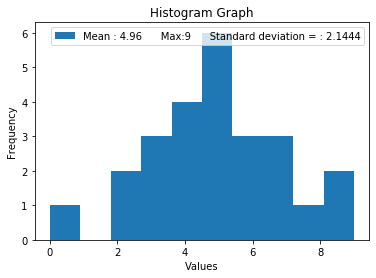

In [73]:
# First, we make a frequency histogram using matplotlib. We start by creating a list called x
x = [random.randrange(10) for i in range(25)]

# Here, we are going to create the graph using matplotlib and the list x
plt.figure()
plt.title("Histogram Graph")
plt.xlabel('Values')
plt.ylabel('Frequency')
# Calculating the average
avg = round(sum(x)/len(x), 4)
# We calculate the variance and standard deviation to show them in the legend 
variance = 0
for i in x:
    variance+=(i-avg)**2
variance /= len(x)
std = pow(variance, 1/2)
# Finding the maximum
m = max(x)
label1 = "Mean : "+ str(avg)+"      Max:"+str(m)+"      Standard deviation = : " + str(round(std,4))
plt.hist(x, bins=10, label = label1)
plt.legend()
# Showing the final histogram
plt.show()

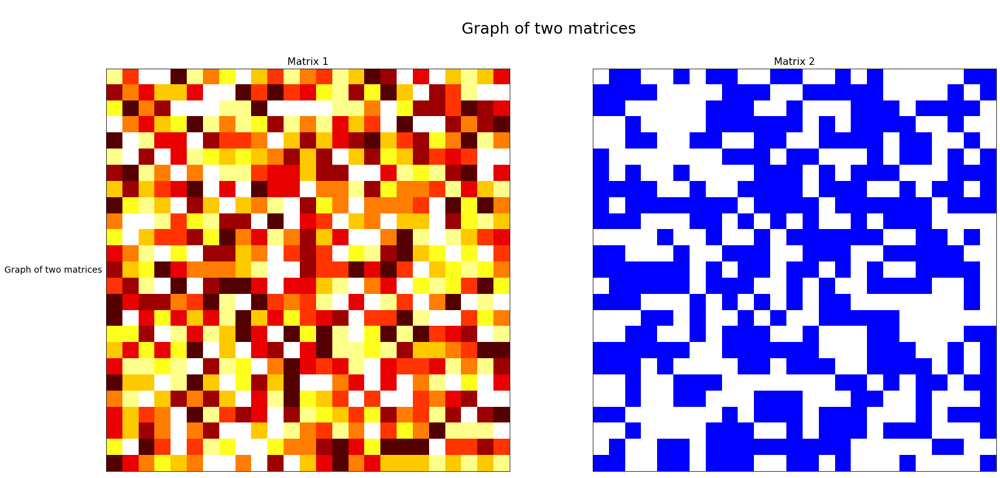

In [111]:
# Second, we use matplotlib to graph 2 matrices side by side(a heatmap and regular map). First, we create mat1, made of 
# random numbers between 0 and 9 and mat2, made of 0s and 1s.
mat1 = np.random.randint(10, size=(25, 25))
mat2 = np.random.randint(2, size=(25, 25))

# We set the size of the matplotlib figure
plt.rcParams["figure.figsize"] = (22,11)

# We split the matplotlib figure into 2 graphs. The left graph will be a heatmap of matrix one, while the rightmost graph
# will be a "blue graph" of matrix 2 where its 0s and 1s will be represented as white and blue squares
# respectively.
fig, ax = plt.subplots(1,2,sharey = True)

# We assign ax1 to be the graph on the left and ax2 to be the rightmost graph 
ax1, ax2 = ax

# The next step is to set the figure's title and adjusting a couple parameters
fig.suptitle("\n Graph of two matrices", fontsize=25)
fig.tight_layout()
fig.subplots_adjust(top=0.85)

# We set up the legend on the left here
t = "Graph of two matrices"
ax1.text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=ax1.transAxes)

# For plot 1(left), we create a list using np.arange. Then we import the first colormap and set it to cmap. After the
# following lines have been ran, we will have created a heatmap that assigns values close to 0 dark colors and 
# assigns lighter colors to values closer to 9.
bounds = np.arange(-1,10,1)
cmap = plt.get_cmap("hot")
norm = colors.BoundaryNorm(bounds, cmap.N)

# The next lines uses the colormap created above and makes the graph using mat1
ax1.imshow(mat1, cmap=cmap, norm=norm)

# We set the x and y axis invisible and the title of the left graph to Matrix 1
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
ax1.set_title("Matrix 1", fontsize=16)


#For plot 2(right), we start off by creating a colormap that will assign white to 0 and blue to values equal to 1.
cmap = colors.ListedColormap(["white", 'blue'])
bounds = (-1,1,1)
norm = colors.BoundaryNorm(bounds, cmap.N)

# The next lines uses the colormap created above and makes the graph using mat2
ax2.imshow(mat2, cmap=cmap, norm=norm)

# We set the x and y axis invisible and the title of the left graph to Matrix 2
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
ax2.set_title("Matrix 2", fontsize=16)

# Showing the final figure
plt.show()

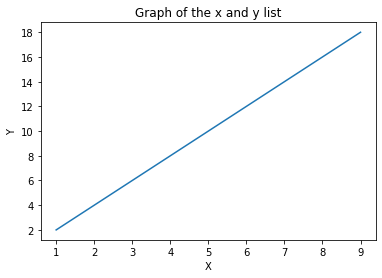

In [115]:
# Third and finally, we use matplotlib to graph a regular graph. We start by setting the dimmensions of the graph.`2
plt.rcParams["figure.figsize"] = (6,4)

# We then create two lists with x and y coordinates
x = [1,2,3,4,5,6,7,8,9]
y = [2,4,6,8,10,12,14,16,18]

# We create the matplotib figure
plt.figure()
# We plot our x and y lists
plt.plot(x, y)
# Setting up the title and the x and y axis labels
plt.title("Graph of the x and y list")
plt.xlabel("X")
plt.ylabel("Y")
# Showing the graph
plt.show()

<a id='000-52'></a>
## Introducing the dataset
Before we begin applying the concepts of differential privacy, we need to introduce the dataset which we will be using in the notebook later on. We used the the [TLC Trip Record Data](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page). This dataset includes 1.1 billion different entries each including the pick-up and drop-off locations of taxi trips in New York during a part of 2009. We used the february 2016 Yellow Taxi Trip Records, which you can download either by navigating the [TLC Trip Record website](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page) or clicking on this [link](https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2016-02.csv). Once you have downloaded it, we use pandas coupled with a few other libraries to download the data into this notebook.

<a id='000-521'></a>
### Loading the TLC Dataset into the Notebook
 We import pandas with csv and os because they will be useful to retrieve the data. We import clear_output in order to give real time updates of the process. 

In [32]:
import pandas as pd
import csv
import os
from IPython.display import clear_output

The `getDataFrameForTLC()` function takes no inputs, but it should be noted that the directory for the csv file is not the same for everyone and thus should be changed in the function. The function `getDataFrameForTLC()` reads the yellow taxi csv file and returns a huge pandas dataframe with columns "Pickup Lat", "Pickup Lon", "Dropoff Lat" and "Dropoff Lon" of the taxi rides.

In [33]:
def getDataFrameForTLC():
    # change the directory below to point to your data file
    directory = "C://Users//thesm//Dropbox//Differential Privacy Project//yellow_tripdata_2016-02.csv"
    # opening the file using csv
    with open(directory) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter = ',')
        pickup_lat = []
        pickup_lon = []
        dropoff_lat = []
        dropoff_lon = []
        counter=0
        for row in csv_reader:
            if counter!=0:
                pickup_lat.append(round(float(row[6]),5))
                pickup_lon.append(round(float(row[5]),5))
                dropoff_lat.append(round(float(row[10]),5))
                dropoff_lon.append(round(float(row[9]),5))
            counter+=1
        #creating a dataframe with the latitude, longitude, date, time and computer time of each and single point recorded 
        df = pd.DataFrame({
            'Pickup Lat': pickup_lat,
            'Pickup Lon': pickup_lon,
            'Dropoff Lat': dropoff_lat,
            'Dropoff Lon': dropoff_lon
        })
        df['Pickup Lat'] = df['Pickup Lat'].astype('float32')
        df['Pickup Lon'] = df['Pickup Lon'].astype('float32')
        df['Dropoff Lon'] = df['Dropoff Lon'].astype('float32')
        df['Dropoff Lon'] = df['Dropoff Lon'].astype('float32')
        return df

In [ ]:
#We use the functions above to store the list of dataframes in allDF if the data was locally stored on the computer
allDF = getDataFrameForTLC()

In [ ]:
# Showing what the df looks like
allDF

<a id='000-522'></a>
### Graphing the data

We now have the data loaded in a dataframe ready to be manipulated, but before we do that, let's see what the data set looks like! We import a couple libraries below which will either be used together or independently to graph the dataset. First, ipyleaflet will make graphs showing the pickup and dropoff locations. Then, using datashader, geoviews, holoviews and bokeh, we make graphs which include all the data points and finally, we graph, on a black canvas, all the data within the New York area. 

In [ ]:
from ipyleaflet import *
import datashader as ds
import geoviews as gv
import holoviews as hv
from colorcet import fire
from holoviews.operation.datashader import datashade, dynspread
import datashader.transfer_functions as tf

In [ ]:
#We set up the bokeh extension for graphing with datashader, goeviews and holoviews.
hv.notebook_extension('bokeh')

The following function `drawingIndividalTrip` takes for input the dataframe of the taxi data and the index of the individual trip you want to graph. It then plots two points, the dropoff and pickup coordinates of the individual trip, on an ipyleaflet map.

In [ ]:
def drawingIndividalTrip(allDF, individual, m):
    row = allDF.loc[individual]
    marker1 = CircleMarker(location=(row['Pickup Lat'], row['Pickup Lon']), radius = 1, color="red", fill_color="red")
    marker2 = CircleMarker(location=(row['Dropoff Lat'], row['Dropoff Lon']), radius = 1, color="red", fill_color="red")

    marker_cluster = MarkerCluster(
        markers=(marker1, marker2)
    )
    
    m.add_layer(marker_cluster)

In [ ]:
m = Map(center = (40,-74), zoom=7)
drawingIndividalTrip(allDF, 1, m)
m

The next function takes the dataframe created by the `getDataFrameForTLC` function as an input and returns another dataframe that converted the "Pickup Lat", "Pickup Lon", "Dropoff Lat" columns into "Pickup X", "Pickup Y", "Dropoff X", "Dropoff Y" collumns. In other words, it changes the latitude and longitude into meters units. This function uses pandas and datashaders.

In [ ]:
def createXYcolumns(allDF):
    df= pd.DataFrame({})
    o = ds.utils.lnglat_to_meters(allDF['Pickup Lon'],allDF['Pickup Lat'])
    df['Pickup X'] = o[0]
    df['Pickup Y'] = o[1]
    o =ds.utils.lnglat_to_meters(allDF['Dropoff Lon'],allDF['Dropoff Lat'])
    df['Dropoff X'] = o[0]
    df['Dropoff Y'] = o[1]
    return df

In [ ]:
#We use the function above to create a dataframes with 'X' and 'Y' columns
df_XY = createXYcolumns(allDF)

In [ ]:
# Showing what the df looks like
df_XY

We will now start to graph the data using *datashader*, *goeviews*, *holoviews* and *bokeh*. The next funcion takes a dataframe as input and returns a map with all the points of the dataframe ploted. We are using *datashader*, *holoviews*, *geoviews* and *bokeh* because *ipyleaflet* could not handle more than 10,000 points, while the other 4 can handle up to a few billion points.

In [ ]:
#We draw the whole data set using the above function and inputing the dataframe df which has all the data.
def drawDataFrame(df, w, h):
    geomap = gv.tile_sources.OSM.opts(width=w, height=h)
    points = hv.Points(gv.Dataset(df, kdims = ['X', 'Y']))
    agg = dynspread(datashade(points, color_key = fire, element_type= gv.Image, aggregator = ds.count()))
    return geomap*agg

In [ ]:
# The dataframe below compacts the 4 column data frame into a 2 column dataframe  
df = pd.concat([pd.DataFrame({"X":df_XY['Pickup X'], "Y":df_XY['Pickup Y']}), pd.DataFrame({"X":df_XY['Dropoff X'], "Y":df_XY['Dropoff Y']})], ignore_index=True)
# Showing the df
df

In [ ]:
#We draw the whole data set using the above function and inputing the dataframe df which has all the data
drawDataFrame(df, 800, 600)

The above code created an interactive map of the whole dataset, we will now create a static and focused map of the New York area to understand how the data is clustered. 

The `focusNewYork()` function returns a dataframe where all 'X' and 'Y' coordinates are within the New York area. It only uses *pandas*.

In [ ]:
def focusNewYork(df_XY):
    dfNewYork = df_XY[df_XY['Pickup X'] < -8220944.3950]  
    dfNewYork = dfNewYork[dfNewYork['Pickup X'] >-8243208.2932]
    dfNewYork = dfNewYork[dfNewYork['Pickup Y'] < 4985827.8487]
    dfNewYork = dfNewYork[dfNewYork['Pickup Y'] > 4965255.7016]
    dfNewYork = dfNewYork[dfNewYork['Dropoff X'] < -8220944.3950]  
    dfNewYork = dfNewYork[dfNewYork['Dropoff X'] >-8243208.2932]
    dfNewYork = dfNewYork[dfNewYork['Dropoff Y'] < 4985827.8487]
    dfNewYork = dfNewYork[dfNewYork['Dropoff Y'] > 4965255.7016]
    dfNewYork = dfNewYork.reset_index(drop=True)
    return dfNewYork

In [ ]:
# Creating the dfNewYork which removes all points not within the New York area
dfNewYork = focusNewYork(df_XY)
# Showing what the new dataframe looks like
dfNewYork

The next function, `plotDFNewYorkWithDS`, uses *datashader*, *holoviews*, *geoviews* and *bokeh* and the dataframe of the New York area to plot all the points within New York on a black background. 

In [ ]:
def plotDFNewYorkWithDS(dfNewYork,w, h):
    x_range = (-8243208.2932, -8220944.3950)
    y_range = (4965255.7016, 4985827.8487)
    cv = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cv.points(dfNewYork, 'X', 'Y')
    return tf.set_background(tf.shade(agg, cmap=fire),"black")

In [ ]:
# The dataframe below is just a two columns dataframe of the data, rather than 4 columns, of dfNewYork
plotting_df = pd.concat([pd.DataFrame({"X":dfNewYork['Pickup X'], "Y":dfNewYork['Pickup Y']}), pd.DataFrame({"X":dfNewYork['Dropoff X'], "Y":dfNewYork['Dropoff Y']})], ignore_index=True)
# Showing what the plotting_df looks like
plotting_df

In [ ]:
# Plotting the New York df using the above function
plotDFNewYorkWithDS(plotting_df,600, 524)

<a id='000-3'></a>
## Privacy Definition

### $\varepsilon$-indistinguishability.
We will first begin by defining the concept of $\varepsilon$-indistinguishability. 

Let $X$ and $X'$ be two random variables over a finite set $\mathcal{A}$ and $\varepsilon$ be a non-negative real number. Then, we say $X$ is $\varepsilon$-indistinguishable from $X'$, denoted by $X \overset{\varepsilon}{\sim} X'$, if $e^{-\varepsilon} \leq \frac{\Pr[X = x]}{\Pr[X' = x]} \leq e^{\varepsilon}$, for every $x \in \mathcal{A}$.

This notion measures the closeness of two random variables. It satisfies the following transitivity property.

Let $X$, $X'$, and $X''$ be random variables over a finite set $A$ such that $X \overset{\varepsilon}{\sim} X'$ and $X' \overset{\varepsilon}{\sim} X''$. Then, $X \overset{2\varepsilon}{\sim} X''$.

The proof is as follow. By definition, for every $x \in \mathcal{A}$, it holds that 
$$ e^{-\varepsilon} \leq \frac{\Pr[X = x]}{\Pr[X' = x]} \leq e^{\varepsilon} \quad \text{and} \quad e^{-\varepsilon} \leq \frac{\Pr[X' = x]}{\Pr[X'' = x]} \leq e^{\varepsilon} .$$
The result follows from multiplying both inequalities.

### Local Differential Privacy
We now define local differential privacy (LDP).

Let $\varepsilon$ be a non-negative real number. A randomized mechanism $\mathcal{M}:\mathcal{D} \to \mathcal{V}$ is $\varepsilon$-LDP if $\mathcal{M}(d) \overset{\varepsilon}{\sim} \mathcal{M}(d')$, for every $d, d' \in \mathcal{D}$.

We will now show that if for any input, the output of a mechanism is $\varepsilon$-indistinguishability from a uniform random variable, then the mechanism is locally differentially private.

Let $U$ be the uniform random variable over the set $\mathcal{V}$ and $\mathcal{M}:\mathcal{D} \to \mathcal{V}$ a randomized mechanism such that $\mathcal{M}(d) \overset{\varepsilon}{\sim} U$, for every $d \in \mathcal{D}$. Then, $\mathcal{M}$ is a $2\varepsilon$-locally differentially private mechanism.

We prove the previous statement: for every $d,d' \in \mathcal{D}$, it holds that $\mathcal{M}(d) \overset{\varepsilon}{\sim} U \overset{\varepsilon}{\sim} \mathcal{M}(d')$. Thus, since if $ X \overset{\varepsilon}{\sim} X'$ and $X' \overset{\varepsilon}{\sim} X''$, then $X \overset{2\varepsilon}{\sim} X''$, $\mathcal{M}(d) \overset{2\varepsilon}{\sim} \mathcal{M}(d')$, which is the definition of $2\varepsilon$-local differential privacy.

<a id='000-4'></a>
## Concentration Inequalities

In this section, we state two inequalities used to analyze the performance of our scheme. Let $X_1,\ldots,X_n$ be random variables such that $-1\leq X_i \leq 1$, let $X = X_1+\ldots+X_n$, $\mu = E[X]$, and $\sigma^2 = \mathrm{Var}[X]$. Then, for every $\lambda >0$, the following inequalities hold.

$$
    \Pr[X\geq \mu + \lambda ] \leq \exp \left(\frac{- \lambda^2}{2 \left( \sigma^2 +\frac{2\lambda}{3} \right)} \right) 
$$
and
$$
    \Pr[X\leq \mu - \lambda ] \leq \exp \left(\frac{- \lambda^2}{2 \left( \sigma^2 +\frac{2\lambda}{3} \right)} \right) .
$$

If we use a random walk and say that we are $\lambda = t*\sqrt{n}$ away from the mean, then since  $\sigma^2=N$, the equations boils down to 
$$
    \Pr[X\geq \mu + t*\sqrt{n} ] \leq \exp \left(\frac{- (t*\sqrt{n})^2}{2 \left( n +\frac{2*t*\sqrt{n}}{3} \right)} \right) 
$$
and
$$
    \Pr[X\geq \mu - t*\sqrt{n} ] \leq \exp \left(\frac{- (t*\sqrt{n})^2}{2 \left( n +\frac{2*t*\sqrt{n}}{3} \right)} \right) 
$$

In [2]:
from ipywidgets import interact, fixed
import ipywidgets as widgets
import math

In [36]:
@interact(t=(0,50,1), n = (0,int(10e6),1))
def getP(t, n):
    print(f"The probability P that the random walk variable X is greater than equal to E[x]+{round(t*math.sqrt(n))} or smaller than or equal to [x]-{round(t*math.sqrt(n))}, where √n is the standard deviation, is greater than or equal to {math.exp((-t**2*n)/(2*(n+(2*t*math.sqrt(n)/3))))}")

interactive(children=(IntSlider(value=25, description='t', max=50), IntSlider(value=5000000, description='n', …

We can make a couple notes from running the code and doing the math. First, since $e^{-N}$ with high order terms, then as $N\rightarrow\infty$ then $p\rightarrow0$. This can be tested with the above code when $t$ is set constant. We should also note that $e^{-t}$ with high order terms, thus when $t\rightarrow\infty$ then $p\rightarrow0$.

<a id='000-5'></a>
## Partitioning the Data and the Map into Disjoint Regions
Cabdriver's privacy consists of two layers. The first layer is a result of the the partitioning of the space into regions $\mathcal{R}_1, \ldots, \mathcal{R}_r$; two points within the same region $\mathcal{R}_i$ are indistinguishable from the scheme's perspective. Thus, the scheme can be adapted depending on how much \emph{resolution} is needed for a particular application. For example, in the first example, each region corresponds to a $300m^2$ square. This means that even before applying the mechanism, the user's encoding cannot distinguish two points in the same $300m^2$ square. If the application of interest needed more resolution, then the amount of regions would need to increase -- and the parameter $r$ too. On the other hand, if less resolution is needed, it is in the interest of privacy that the regions be changed accordingly. 


### Partitioning the Map
Throughout this section we partition the map, more explanation on what we mean later. First, we import the library numpy and the math module.

In [2]:
import numpy as np
import math

The next function partition the map. What we mean by partitioning the map is to transform a rectangular area into a grid and store the grid under the form of a matrix. By taking the `max_x`, `min_x`, `max_y`, `min_y` coordinates it creates a grid with squares of dimensions `divisor`\*`divisor`, and from there a matrix where each square of the grid is represented by a 0 in the numpy matrix. The function returns a list of the matrix and a list of the `max_x`, `min_x`, `max_y`, `min_y` and the `divisor`, which allows us to do more manipulation later with the matrix.

<h4><center>Example:</center></h4>

   In the example below, imagine max_x=110, min_x=50, max_y=90, min_y=50 and divisor=10. The function will divide the 40x60 meters rectangle into a grid of 10x10 meters squares and thus create a 4x6 matrix. Below is the rectangle that is divided.

![](img/MatrixDrawing.png)

The output matrix looks something like this:
$$\begin{bmatrix} 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \end{bmatrix}$$ 

In [30]:
def partitionMap(max_x, min_x, max_y, min_y, divisor, *dtype):
    if type(max_x)!=int or type(max_y)!=int or type(min_y)!=int or type(min_x)!=int:
        print("Only take int")
        return -1
    if (max_x-min_x)%divisor!=0:
        max_x = max_x + divisor - (max_x-min_x)%divisor
    if (max_y-min_y)%divisor!=0:
        max_y = max_y + divisor - (max_y-min_y)%divisor
    xdiff = int((max_x-min_x)/divisor)
    ydiff = int((max_y - min_y)/divisor)
    d_type = np.uint8
    if dtype:
        d_type=dtype[0]
    return [[max_x, min_x, max_y, min_y, divisor], np.zeros((ydiff,xdiff), dtype=d_type)]

In [12]:
# The dimmensions of the matrix is 71x77
mat = partitionMap(-8220944, -8243208, 4985828, 4965256, 290)

Now that we have created the functon which can partition the map of New York and return its matrix representation, we have to fill it up with data. We will use the 71x77 matrix created above as an example. You can imagine that this grid splits a map of New York into 5467 squares each of size 290 by 290 meters. 

Since we now have the matrix, we will start adding some data to it. Let's say that our dataset consists of $n$ individuals where each individual has one location, their home. It means we have $n$ locations or data points. An example for the dataset with $n=5$ individuals is shown below.

| index | i   | j|
|----|-----|----|
|0|2|54|
|1|34|17|
|2|26|34|
|3|45|37|
|4|67|28|

In order to enter an individual into the matrix, we will say that if an individual has been on a square, then the corresponding value of the matrix will be a 1. If he was not there, then the value would be 0. Following the example dataset above, the individual matrix of individual of individual 3, $U_3$, would be full of 0s except at $mat[45][37]$ where it would be 1. Then we denote the sum of all individual matrix, $U_n$, by

$$
F(\mathcal{U}_1, \ldots, \mathcal{U}_n) = \sum_{j=1}^n f(\mathcal{U}_j) ,
$$
which counts the amount of users which visited each region. Thus, $F_i = F(\mathcal{U}_1, \ldots, \mathcal{U}_N)_i$ is the amount of users which visited region $\mathcal{R}_i$ and $F(\mathcal{U}_1, \ldots, \mathcal{U}_n)$ is the sum of all the individual matrix.

<a id='000-53'></a>
### Partitioning the data
<a id='000-531'></a>
#### Partitioning
We were able to partition the map, but since we have a dataset, we also want to be able to partition it and use the matrix.
The `changeMatrix` function does just that. It takes the 0 matrix generated by the `partitionMap` function and adds 1's where an individual was. It takes for input the 0 matrix `mat` and the `dfNewYork`, the dataframe with the trips we want to use. We can note that in the format of the input `dfNewYork` is `dfNewYork[:n]`, then it will include the first $n$ individual trips in the dataframe and thus dataset. Thus, the functions returns the sum of all the individual trips up to $n$ or $F(\mathcal{U}_1, \ldots, \mathcal{U}_n)$

Following the dataset, let's assume that some people where picked up at (60,70) and (56,89) and dropped down at (104, 65) and that our matrix input is:
<br>

$$\begin{bmatrix} 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \end{bmatrix}$$ 

Then after the function has ran, our map looks something like this:


![](img/MatrixDrawing2.0.png)

And our output is:
<br>

$$\begin{bmatrix} 1 & 0 & 0 & 0 & 0 & 0 \\ 0 & 1 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 1 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \end{bmatrix}$$ 

In [ ]:
def changeMatrix(mat, dfNewYork):
    oMat = np.zeros((len(mat[1]), len(mat[1][1])), dtype = np.uint16)
    for pickup_x, pickup_y, dropoff_x, dropoff_y in zip(dfNewYork['Pickup X'], dfNewYork['Pickup Y'], dfNewYork['Dropoff X'], dfNewYork['Dropoff Y']):
        if (pickup_x<mat[0][0] and pickup_x>mat[0][1] and pickup_y< mat[0][2] and pickup_y>mat[0][3]) and (dropoff_x<mat[0][0] and dropoff_x>mat[0][1] and dropoff_y< mat[0][2] and dropoff_y>mat[0][3]):
            pickup_i = math.floor((pickup_x-mat[0][1])/mat[0][4])
            pickup_j = math.floor((mat[0][2]-pickup_y)/mat[0][4])
            dropoff_i = math.floor((dropoff_x-mat[0][1])/mat[0][4])
            dropoff_j = math.floor((mat[0][2]-dropoff_y)/mat[0][4])
            if pickup_i==dropoff_i and dropoff_i==dropoff_j:
                oMat[pickup_j][pickup_i] += 1
            else:
                oMat[pickup_j][pickup_i] += 1
                oMat[dropoff_j][dropoff_i] += 1
    return oMat

In [ ]:
%%time
finalMat = changeMatrix(mat, dfNewYork)

<a id='000-532'></a>
#### Graphing matrices

Once we have the matrix, we want to graph it and see the data. The graphing libraries we use- datashader, geoviews, holoviews and bokeh- cannot directly graph a matrix. Thus to graph the matrix, we need to convert the matrix to a dataframe with X and Y coordinates. The function `getDFfromMat` uses numpy and pandas to do just that. The example below explains how the inputs and the outputs work.

<h4><center>Example:</center></h4>

The map which looks like that:
!["Before"](img/MatrixDrawing2.0.png)
<br>

Which becomes the matrix input for `getDFfromMat`:
$$\begin{bmatrix} 1 & 0 & 0 & 0 & 0 & 0 \\ 0 & 1 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 1 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 \end{bmatrix}$$ 

For the matrix above, the inputs should be `getDFfromMat(50, 90, 10, matrixAbove)`. The `lowerX` and `upperY` are just the X and Y coordinates of the top left corner. The `divisor` is the same we entered all the way in the beginning and finally we have to input the matrix, `mat`. `getDFfromMat` uses these inputs to output the following pandas dataframe. 

<table style="width:30%">
<tr>
    <th>Index</th>
<th>X</th>
<th>Y</th>
</tr>

<tr>
<td>0</td>
<td>50</td>
<td>90</td>
</tr>

<tr>
<td>1</td>
<td>60</td>
<td>80</td>
</tr>
    
<tr>
<td>2</td>
<td>90</td>
<td>70</td>
</tr>

</table>

In [ ]:
def getDFfromMat(lowerX, upperY, divisor, mat):
    arr = np.nonzero(mat)
    df = pd.DataFrame({
        'X':(arr[1]*divisor)+lowerX,
        'Y':upperY-(arr[0]*divisor)
    })
    return df

In [ ]:
# We use getDFfromMat to get the df of the matrix and plot it using datashader, bokeh, etc... using plotDFNewYorkWithDS
graphdf = getDFfromMat(-8243208, 4985828, 10, finalMat)
plotDFNewYorkWithDS(graphdf,600, 524)

Below, we ran the data through different size of matrices by changing the input of the `discretizeSpace()` function and then graphed it using the `plotDFNewYorkWithDS()` combined with `getDFfromMat()`. From top left to bottom right, the dimmensions of the matrix squares are 10x10, 40x40 and 50x50.

<img src="img/FocusedOnNY10x10,20x20,40x40.jpg" width="1200">

<a id='000-6'></a>
## CABDRIVER Scheme
<a id='000-61'></a>
### Private Scheme
In this section, we describe CABDRIVER Scheme and we write the code.

We begin by describing the underlying randomized mechanism within Cabdriver. Let $\mathcal{M}: 2^\mathcal{X} \rightarrow \{-1,+1\}^r$ be the randomized mechanism such that, for every $\mathcal{U} \subseteq \mathcal{X}$, if $\mathcal{U} \cap \mathcal{R}_i = \emptyset$, then $\mathcal{M}(\mathcal{U})_i$ is chosen uniformly at random from $\{-1,+1\}$. But, if $\mathcal{U} \cap \mathcal{R}_i \neq \emptyset$, then $\mathcal{M}(\mathcal{U})_i$ is equal to $+1$ with probability $\frac{1}{2} + \alpha$ and $-1$ with probability $\frac{1}{2} - \alpha$, where $\alpha \in [0,0.5]$ is a privacy parameter chosen by the user.

While the math was done in general for users chosing different $\alpha$ values, we wrote the code using one $\alpha$ for all the users.

The function `randomScheme` takes for input `mat` or a 0 matrix with the dimensions we want to use, `alpha` (a probability between 0 and 0.5), `n` or the number of trips(ie. the pickup and dropoff coordinates of one trip) we want to run the function for and the optional boolean input `include_all_individuals` which will include all users if True or will not include all user if False.

The function starts off by creating an empty matrix of the same dimensions as the input matrix. The function then iterates through each individual in the dataframe and for each individual it will do the following process:
 1. It creates a 20 by 20 matrix, which we will call an individual matrix. 
 2. The individual matrix is then filled randomly by 1 and -1. The matrix looks something like this at this stage: 
$$\begin{bmatrix} 1 & 1 & -1 & 1 & -1 & -1 \\ 1 & -1 & 1 & -1 & 1 & -1 \\ -1 & 1 & 1 & -1 & -1 & 1 \\ -1 & 1 & -1 & 1 & 1 & -1 \end{bmatrix}$$ 
 3. Finally, with probability $0.5+\alpha$ the individual's location(s), (i,j), in the matrix will be turned into a 1 and with probability $0.5-\alpha$ the individual's location will be -1. Below, P(x) denotes the probabality of x being the final value of the cell:
$$\begin{bmatrix} 1 & 1 & -1 & 1 & -1 & -1 \\ 1 & P(1)= 0.5+\alpha \space and \space P(-1)= 0.5-\alpha & 1 & -1 & 1 & -1 \\ -1 & 1 & 1 & -1 & -1 & 1 \\ -1 & 1 & -1 & P(1)= 0.5+\alpha \space and \space P(-1)= 0.5-\alpha \end{bmatrix}$$ 

Each of these indivual matrices will be added to the empty matrix created initially by the function and in the end, each cell value in the matrix will be divided by $2*\alpha$ so as to return a matrix of expected values. We divide by $2\alpha$ in order to make an unbiased estimator as shown in the later section, [Privacy Analysis](#000-7). 


The function `randomScheme` returns the matrix summing all the individual matrices and the 3 individual matrices chosen at random as well as the 3 indices of the 3 random matrices chosen.

In the end, the output matrix will be able to show where the clusters of people are while the individual's matrices would be totally random and private. By only looking at individual matrix, it would be impossible to determin the exact (i,j) location that the individual entered into the dataset and thus the individuals would be protected while the overall pattern of the dataset, such as clusters, would still be observed.

In [37]:
def randomScheme(mat, alpha, n, include_all_individuals = False):
    oMat = np.zeros((len(mat[1]), len(mat[1][1])), dtype = int)
    print("0.0%")
    c = 1
    arr = random.sample(range(n), 3)
    temp = arr.copy()
    ind_mats = []
    counter = [0,0]
    for individual in dfNewYork.index[:n]:
        tempMat = np.ones((len(mat[1]), len(mat[1][1])), dtype = np.int8) 
        for i in range(len(tempMat)):
            for j in range(len(tempMat[1])):
                if random.random()<0.5:
                    tempMat[i][j]=-1
        pickup_x, pickup_y, dropoff_x, dropoff_y = dfNewYork.loc[individual]['Pickup X'], dfNewYork.loc[individual]['Pickup Y'], dfNewYork.loc[individual]['Dropoff X'], dfNewYork.loc[individual]['Dropoff Y']
        if (pickup_x<mat[0][0] and pickup_x>mat[0][1] and pickup_y< mat[0][2] and pickup_y>mat[0][3]) and (dropoff_x<mat[0][0] and dropoff_x>mat[0][1] and dropoff_y< mat[0][2] and dropoff_y>mat[0][3]):
            pickup_i = math.floor((pickup_x-mat[0][1])/mat[0][4])
            pickup_j = math.floor((mat[0][2]-pickup_y)/mat[0][4])
            dropoff_i = math.floor((dropoff_x-mat[0][1])/mat[0][4])
            dropoff_j = math.floor((mat[0][2]-dropoff_y)/mat[0][4])
            if pickup_i==dropoff_i and dropoff_i==dropoff_j:
                if not include_all_individuals:
                    if n<10437348:
                        n+=1
                else:
                    counter[0]+=1
                    if random.random()<0.5+alpha:
                        counter[1]+=1
                        tempMat[pickup_j][pickup_i] = 1
                    else:
                        tempMat[pickup_j][pickup_i] = -1
            else: 
                counter[0]+=2
                if random.random()<0.5+alpha:
                    counter[1]+=1
                    tempMat[pickup_j][pickup_i] = 1
                else:
                    tempMat[pickup_j][pickup_i] = -1

                if random.random()<0.5+alpha:
                    counter[1]+=1
                    tempMat[dropoff_j][dropoff_i] = 1
                else:
                    tempMat[dropoff_j][dropoff_i] = -1
        
            oMat+=tempMat
            if c%1000==0:
                clear_output()
                print("For alpha= "+str(alpha)+", n= "+ str(n)+ f" and dimensions = {len(finalMat)}x{len(finalMat[1])}\n"+ str(round(100*(c)/n, 1))+"%", flush=True)
            c+=1
            if individual in arr:
                arr.remove(individual)
                ind_mats.append(tempMat)
        else:
            if n<10437348:
                n+=1
    for i in range(len(oMat)):
        for j in range(len(oMat[1])):
            oMat[i][j]=round(oMat[i][j]/(2*alpha))
    return temp, ind_mats, oMat

Below we run the above experiment with `n`=1e6, `alpha` = 0.2 and the input matrix `mat`. The first line `%%time` allows us to know how much time the cell took to run. The `finalMat` variable holds the data that has not gone through the private scheme, while the `oMat` matrix will hold the differential private data that has gone through the private scheme.

In [ ]:
%%time
n=int(1e6)
alpha = 0.2
mat = discretizeSpace(-8220944, -8243208, 4985828, 4965256, 290)
finalMat = changeMatrix(mat, dfNewYork[:n])
indices, ind_mats, oMat = randomScheme(mat, alpha, n)

<a id='000-62'></a>
### Graphing Our Results

When we finish running the code above we may want to know what the output is. In this section, we look into graphing the results we got from running the cell above and generating visual data. We also attached a folder in the same directory with many more results. 

Before graphing our data, I need to introduce 3 helper functions. The first function is called `hotspotFunction`. The function takes for input a matrix, `mat`, and `kFactor`. It returns returns another matrix called hotspot which has 1s where mat[i][j]>=kFactor and 0s where mat[i][j]<kFactor.

<h4><center>Example:</center></h4>

In the example below, the input is the matrix and we set `kFactor`=3. 

Before running `hotspotFunction`:
$$\begin{bmatrix} 1 & 2 & 3 & 3 & 0 & 0 \\ 0 & 0 & 2 & 3 & 0 & 0 \\ 0 & 0 & 1 & 3 & 4 & 0 \\ 0 & 0 & 0 & 1 & 4 & 3 \end{bmatrix}$$ 
<br>

<h1><center>$\downarrow$</center></h1> 

After running `hotspotFunction` with `kFactor`=3:
$$\begin{bmatrix} 0 & 0 & 1 & 1 & 0 & 0 \\ 0 & 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 0 & 1 & 1 & 0 \\ 0 & 0 & 0 & 0 & 1 & 1 \end{bmatrix}$$ 

In [ ]:
def hotspotFunction(mat, kFactor):
    l1 = len(mat)
    l2 = len(mat[1])
    arr = np.nonzero(mat)
    cord = list(zip(arr[0],arr[1]))
    hotspot = np.zeros((l1,l2), dtype=dtype=np.uint8)
    for i in cord:
        if mat[i[0]][i[1]]>=kFactor:
            hotspot[i[0]][i[1]]=1
    return hotspot

The second function is called `getThresholdedFunction`. Although very similar to the previous function `hotspotFunction`, it has a couple differences. It takes for input `thresh` and the matrix, `mat`. It returns returns another matrix called `o` which has the value mat[i][j] where mat[i][j]>=thresh and 0 where mat[i][j]<kFactor.

<h4><center>Example:</center></h4>

In the example below, the input is the matrix and we set thresh=3. 

Before running `getThresholdedFunction`:
$$\begin{bmatrix} 1 & 2 & 3 & 3 & 0 & 0 \\ 0 & 0 & 2 & 3 & 0 & 0 \\ 0 & 0 & 1 & 3 & 4 & 0 \\ 0 & 0 & 0 & 1 & 4 & 3 \end{bmatrix}$$ 
<br>

<h1><center>$\downarrow$</center></h1> 

After running `getThresholdedFunction` with thresh=3:
$$\begin{bmatrix} 0 & 0 & 3 & 3 & 0 & 0 \\ 0 & 0 & 0 & 3 & 0 & 0 \\ 0 & 0 & 0 & 3 & 4 & 0 \\ 0 & 0 & 0 & 0 & 4 & 3 \end{bmatrix}$$ 

In [ ]:
def getThresholdedFunction(mat, thresh):
    o = np.zeros((len(mat), len(mat[1])), dtype=int)
    for i in range(len(mat)):
        for j in range(len(mat[1])):
            if mat[i][j]>=thresh:
                o[i][j]=mat[i][j]
    return o

The third and final function `hammingDistance` gets the hamming distance between two matrices. When it the `forHotspot` input(a boolean) is True, we assume the matrices are hotspots of each other and the function works in a certain way. For example, if the input "hotspot1" is the hotspot from *n* individuals, the input "hotspot2" needs to be the hotspot from the same *n* individuals plus any other individual(s). However, if `forHotspot` is false it caclulates the hamming distance the "traditional way".

We first start by introducing the hamming distance between two matrices. In our case, the hamming distance between two binary matrices of same dimensions is the number of bit positions in which the two bits are different. Later, we use the hamming distance to play with the idea of the influence of an individual. 

<h4><center>Example:</center></h4>

We calculate the hamming distance between the two given matrices below.

$$\begin{bmatrix} 1 & 0 & 0 & 1 & 0 & 1 \\ 0 & 1 & 0 & 1 & 1 & 0 \\ 0 & 0 & 1 & 0 & 1 & 0 \\ 1 & 0 & 0 & 0 & 1 & 0 \end{bmatrix} \begin{bmatrix} 0 & 0 & 1 & 1 & 0 & 0 \\ 0 & 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 0 & 1 & 1 & 0 \\ 0 & 0 & 0 & 0 & 1 & 1 \end{bmatrix} $$

The indices [i,j] are the same as matrix[i][j]. For example, the left matrix at indices [0,0] is equal to 1 while the right matrix at indice [0,0] is equal to 0. To get the hamming distance, we need to consider any point where the leftMatrix[i][j]!=rightMatrix[i][j]. The matrices are different at indices [0,0], [0,2], [0,5], [1,1], [1,4], [2,2], [2,3], [3,0] and [3,5]. This is a total of 9 places, thus the hamming distance is equal to 9.

In [ ]:
def hammingDistance(hotspot1, hotspot2, forHotspot):
    if forHotspot:
        arr1 = np.nonzero(hotspot1)
        arr2 = np.nonzero(hotspot2)
        return abs(len(arr1[0])- len(arr2[0]))
    else: 
        hdist = 0
        for i in range(len(hotspot1)):
            for j in range(len(hotspot1[1])):
                if hotspot1[i][j]!=hotspot2[i][j]:
                    hdist+=1
    return hdist

Before graphing anything, we import matplotlib.colors as it will be crucial to have a colormap to graph the matrices generated. 

In [ ]:
import matplotlib.colors as colors

The next function, `getHeatmap`, takes for input two matrices, the matrix after the random scheme and the matrix with the data loaded without the random scheme. It also takes for input the list `thresholds` and the float `alpha`. The function runs the threshold function for both matrices and graph their hotspots side by side for all the thresholds in the input list. For example, let's say we get for input matrices with dimmensions 71x77 after having gone through the random scheme with 6 million trips and alpha=0.2 and the raw data matrix. The thresholds input is [0, 12247, 24494, 36741, 48988] and the image generated is:
<img src="img/heatMap.png" width="600">

In [ ]:
def getHeatmap(oMat, finalMat, thresholds, alpha, show=True):
    cap = ((findMax(oMat, finalMat)/123767)*6000)/(alpha)
    
    # Setting dimmensions of graph 
    plt.rcParams["figure.figsize"] = (22,len(thresholds)*11)

    # Colormap
    cmap = plt.get_cmap("hot")

    # Creating the plots and axis
    fig, ax = plt.subplots(len(thresholds),2,sharey = True)
    fig.suptitle("\nThe heatmaps based on number of people", fontsize=25)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    
    counter = 0
    for ax1, ax2 in ax:
        # Getting the matrices
        data_rand = getThresholdedFunction(oMat, thresholds[counter])
        data = getThresholdedFunction(finalMat, thresholds[counter])
        
        # Getting the boundaries
        intervals = int((cap-thresholds[counter]-1)/241)
        bounds = np.arange(thresholds[counter]-1,cap,intervals)

        # For plot 1(left)
        norm = colors.BoundaryNorm(bounds, cmap.N)

        ax1.imshow(data_rand, cmap=cmap, norm=norm)

        ax1.get_xaxis().set_visible(False)
        ax1.get_yaxis().set_visible(False)
        ax1.set_title("Threshold Matrix after random scheme", fontsize=16)
        t = "Alpha = "+ str(alpha) + "           \n Threshold = " + str(thresholds[counter]) +"          \n Hamming Distance = " + str(hammingDistance(data_rand, data, False))
        ax1.text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=ax1.transAxes)

        #For plot 2(right)
        norm = colors.BoundaryNorm(bounds, cmap.N)

        ax2.imshow(data, cmap=cmap, norm=norm)

        ax2.get_xaxis().set_visible(False)
        ax2.get_yaxis().set_visible(False)
        ax2.set_title("Threshold Matrix without random scheme", fontsize=16)

        counter+=1

    #Showing final plot
    if show:
        return plt.show()

The next function, `getBlueMap`, takes for input two matrices, the matrix after the random scheme and the matrix with the data loaded without the random scheme. It also takes for input the list `thresholds` and the float `alpha`. The function runs the threshold function for both matrices and graph the matrices in blue side by side for all the thresholds in the input list. For example, let's say we get for input matrices with dimmensions 71x77 after having gone through the random scheme with 6 million trips and alpha=0.2 and the raw data matrix. The thresholds input is [0, 12247, 24494, 36741, 48988] and the image generated is:
<img src="img/blueMap.png" width="600">

In [ ]:
def getBlueMap(oMat, finalMat, thresholds, alpha, show=True):
    # Setting dimmensions of graph 
    plt.rcParams["figure.figsize"] = (22,len(thresholds)*11)
    
    # Creating the plots and axis
    fig, ax = plt.subplots(len(thresholds),2,sharey = True)
    fig.suptitle("\nThe blue maps", fontsize=25)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    
    counter = 0
    for ax1, ax2 in ax:
        # Getting the matrices
        data_rand = getThresholdedFunction(oMat, thresholds[counter])
        data = getThresholdedFunction(finalMat, thresholds[counter])

        # For plot 1(left)
        cmap = colors.ListedColormap(["white", 'blue'])
        bounds = (-1,thresholds[counter]+1,500000)
        norm = colors.BoundaryNorm(bounds, cmap.N)

        ax1.imshow(oMat, cmap=cmap, norm=norm)

        ax1.get_xaxis().set_visible(False)
        ax1.get_yaxis().set_visible(False)
        ax1.set_title("Threshold Matrix after random scheme", fontsize=16)
        t = "Alpha = "+ str(alpha) + "           \n Threshold = " + str(thresholds[counter]) +"          \n Hamming Distance = " + str(hammingDistance(data_rand, data, False))
        ax1.text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=ax1.transAxes)

        #For plot 2(right)
        bounds = (-1,thresholds[counter]+1,100000)
        norm = colors.BoundaryNorm(bounds, cmap.N)

        ax2.imshow(finalMat, cmap=cmap, norm=norm)

        ax2.get_xaxis().set_visible(False)
        ax2.get_yaxis().set_visible(False)
        ax2.set_title("Threshold Matrix without random scheme", fontsize=16)

        counter+=1

    #Showing final plot
    if show:
        return plt.show()

Before we continue with graphing functions, I introduce two more helper function. The first function is called `findMax`. It simply finds the maximum value of two matrices and returns it.

In [3]:
def findMax(mat1, mat2):
    m = 0
    for i in range(len(mat1)):
        for j in range(len(mat1[1])):
            if m<mat1[i][j]:
                m=mat1[i][j]
            if m<mat2[i][j]:
                m=mat2[i][j]
    return m

The second fuction is called `find0HammingDisance`. The function uses the function called `hammingDistance` and takes as input two matrices and a lower and upper bonds. The function uses the upper and lower bond to find the biggest threshold for which the hamming distance between the two matrices is 0.

In [ ]:
def find0HammingDisance(mat1, mat2, low, high):
    m = round((high+low)/2)
    while m!=high and m!=low:
        h1 = hotspotFunction(mat1, m)
        h2 = hotspotFunction(mat2, m)
        if hammingDistance(h1, h2, False)==0:
            high=m
        else:
            low=m
        m = round((high+low)/2)
    return highs

The following function, `plotHammingDistance0`, is the third graphing function for this section. It uses the previous two functions and the matrix resulting from the random scheme to plot the two matrices - the matrix of the raw data and the one with the random scheme - when their hamming distance is 0. Below is the result when running the function with dimmensions 71x77 with 6 million trips and alpha=0.2.
<img src="img/hamDist0Map.png" width="600">

In [ ]:
def plotHammingDistance0(oMat, finalMat, alpha, show=True):
    # Setting dimmensions of graph 
    plt.rcParams["figure.figsize"] = (22,11)
    
    # Creating the plots and axis
    fig, ax = plt.subplots(1,2,sharey = True)
    ax1, ax2 = ax
    fig.suptitle("\nThe blue maps with the lowest threshold where hamming distance=0", fontsize=25)
    fig.tight_layout()
    fig.subplots_adjust(top=0.85)
    
    # Getting the threshold
    thresh = find0HammingDisance(finalMat, oMat, 0, findMax(finalMat, oMat)+1)
    
    # Getting the matrices
    data_rand = getThresholdedFunction(oMat, thresh)
    data = getThresholdedFunction(finalMat, thresh)

    # For plot 1(left)
    cmap = colors.ListedColormap(["white", 'blue'])
    bounds = (-1,thresh+1,1000000)
    norm = colors.BoundaryNorm(bounds, cmap.N)

    ax1.imshow(oMat, cmap=cmap, norm=norm)

    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    ax1.set_title("Threshold Matrix after random scheme", fontsize=16)
    t = "Alpha = "+ str(alpha) + "           \n Threshold = " + str(thresh) +"      \n Hamming Distance = 0"
    ax1.text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=ax1.transAxes)

    #For plot 2(right)
    bounds = (-1,thresh+1,1000000)
    norm = colors.BoundaryNorm(bounds, cmap.N)

    ax2.imshow(finalMat, cmap=cmap, norm=norm)

    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    ax2.set_title("Threshold Matrix without random scheme", fontsize=16)

    #Showing final plot
    if show:
        return plt.show()

This is the 5th graphing function. When we finish the random scheme, we ask the function to return 3 individual trips' matrices. This function takes for inputs these 3 matrices and graphs them. Below are the results we got after running the function with dimmensions 71x77 with 6 million trips and alpha=0.2.
<img src="img/3IndsMap.png" width="900">

In [ ]:
def plotIndividualMatrices(ind_mats, indices, alpha, show = True):
    indices.sort()
    
    # Setting dimmensions of graph 
    plt.rcParams["figure.figsize"] = (33,11)
    
    # Creating the plots and axis
    fig, axs = plt.subplots(1,3,sharey = True)
    fig.suptitle("\nThe blue maps of three randomly chosen individuals", fontsize=25)
    fig.tight_layout()
    fig.subplots_adjust(top=0.85)
    

    # Settings
    cmap = colors.ListedColormap(["white", 'blue'])
    bounds = (-1,1,10)
    norm = colors.BoundaryNorm(bounds, cmap.N)
    
    #Set legend
    t = "Alpha = "+ str(alpha)
    axs[0].text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=axs[0].transAxes)
        
    counter = 0
    for ax in axs:
        ax.imshow(ind_mats[counter], cmap=cmap, norm=norm)

        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        ax.set_title("Matrix for individual "+str(indices[counter]), fontsize=16)

        counter+=1
        
    #Showing final plot
    if show:
        return plt.show()

The function `plotHammingDistancevsThresholds` is the 6th and final graphing function. It takes for input the final matrix of the raw data and the output matrix after the random scheme. It increases the thresholds of the two matrices, using the `hotspotFunction` function and calculate the hamming distance between the two matrices until the hamming distance between the two matrices is 0. It stores the hamming distance and their respective thresholds and finally makes a graph of them at that threshold. Below is the output we got after running the function with dimmensions 71x77 with 6 million trips and alpha=0.2.
<img src="img/HammingDistancevsThresholds.png" width="400">

In [ ]:
def plotHammingDistancevsThresholds(oMat, finalMat, save=True, *args, **kwargs):
    # Setting dimmensions of graph 
    plt.rcParams["figure.figsize"] = (6,4)
    
    x = []
    y = []
    ham_dist = -1
    thresh = 0
    while ham_dist!=0:
        h1 = hotspotFunction(oMat, thresh)
        h2 = hotspotFunction(finalMat, thresh)
        ham_dist = hammingDistance(h1, h2, False)
        x.append(thresh)
        y.append(ham_dist)
        thresh+=10
    plt.figure()
    plt.plot(x, y)
    plt.title("Hamming Distance vs. Different thresholds")
    plt.xlabel("Thresholds")
    plt.ylabel("Hamming Distance")
    plt.tight_layout()
    if save:
        plt.savefig(kwargs['name'])
    else:
        plt.show()

Before we introduce the final function of the graphing section, we import os.

In [ ]:
import os

`plotResults`, the final function of the graphing section, combines all the 6 graphing functions. It does so by first creating a folder called "Matrix of dimmension \_\_x_\_ meters alpha=__ n=\_\_" with the appropriate inputs and then importing all the images created by the previous 6 graphing functions and loading them in the folder. The resulting folder of running the `plotResults` function after running the random scheme with dimmensions 71x77 with 6 million trips and alpha=0.2 is in the same root directory as the jupyter notebook you are reading.

In [ ]:
def plotResults(oMat, finalMat, alpha, n, ind_mats, indices):
    dir_name = f"Matrix of dimmension {len(finalMat)}x{len(finalMat[1])} meters alpha={alpha} n={n}"
    os.mkdir(dir_name)
    plotHammingDistancevsThresholds(oMat, finalMat, name=f"{dir_name}/HammingDistancevsThresholds.png")
    getDistribution(finalMat, save=True, name=f'{dir_name}/frequencyGraph')
    s = round(pow(n, 0.5)/(2*alpha))
    getBlueMap(oMat, finalMat,[0,s,2*s, 3*s, 4*s], alpha, show=False)
    plt.tight_layout()
    plt.savefig(f"{dir_name}/blueMap")
    getHeatmap(oMat, finalMat,[0,s,2*s, 3*s, 4*s], alpha, show=False)
    plt.tight_layout()
    plt.savefig(f"{dir_name}/heatMap.png")
    plotHammingDistance0(oMat, finalMat, alpha, show=False)
    plt.tight_layout()
    plt.savefig(f"{dir_name}/hamDist0Map.png")
    plotIndividualMatrices(ind_mats, indices, alpha, show=False)
    plt.tight_layout()
    plt.savefig(f"{dir_name}/3IndsMap.png")

In [ ]:
# This final cell runs the plotResults function 
plotResults(oMat, finalMat, alpha, n, ind_mats, indices)

<a id='000-7'></a>
## Privacy Analysis

Cabdriver's privacy consists of two layers. The first layer is a result of the the partitioning of the space into regions $\mathcal{R}_1, \ldots, \mathcal{R}_r$; two points within the same region $\mathcal{R}_i$ are indistinguishable from the scheme's perspective. Thus, the scheme can be adapted depending on how much \emph{resolution} is needed for a particular application. For example, each region in our matrix corresponds to a $300m^2$ square. This means that even before applying the mechanism, the user's encoding cannot distinguish two points in the same $300m^2$ square. If the application of interest needed more resolution, then the amount of regions would need to increase -- and the parameter $r$ too. On the other hand, if less resolution is needed, it is in the interest of privacy that the regions be changed accordingly. 


The second layer of privacy provided by follows from the fact that the output of the mechanism $\mathcal{M}(\cdot)$ is (approximately) indistinguishable from a uniform distribution on $\{-1,+1\}^r$. This implies, in particular, that Cabdriver is LDP.

Let $d$ be the number of regions visited by a user, $\mathcal{M}: 2^\mathcal{X} \rightarrow \{-1,+1\}^r$ the randomized mechanism defined previously with parameter $\alpha$, and let $\varepsilon = d \log (\frac{1}{1-2 \alpha})$. Then, $\mathcal{M}(\mathcal{U}) \overset{\varepsilon}{\sim} U$, and in particular, $\mathcal{M}(\cdot)$ is $(2\varepsilon)$-locally differentially private, for every $\mathcal{U}$ such that $| \{i:f(\mathcal{U}_i)=1 \}|\leq d$. In other words, the mechanism is 1 $\varepsilon$ indistinguishable from uniform and thus 2 $\varepsilon$ locationally private.

We first import ipywidget and a couple functions that will be useful.

In [9]:
from ipywidgets import interact, fixed
import ipywidgets as widgets
import math

The next function, `calculateE()`, calculates $\varepsilon$ given its input `d` and `alpha`. We use interact as a decorator in order to make it interactive. `d` is fixed at 2 since all of our users visit two locations, pickup and dropoff.

In [2]:
@interact(d=fixed(2),alpha=(0.00,0.49, 0.01))
def calculateE(d,alpha):
    print(f"{round(d*math.log(1/(1-2*alpha)), 3)} distinguishable from uniform and thus {2*round(d*math.log(1/(1-2*alpha)),3)} locationally private")

interactive(children=(FloatSlider(value=0.24, description='alpha', max=0.49, step=0.01), Output()), _dom_class…

<a id='000-8'></a>
## Performance Analysis

We begin by showing that Cabdriver's estimated heat map $\widehat{F}$ after the scheme is an unbiased estimator of the true heat map $F$ and then compute its variance. 

The estimate $\widehat{F}$ is an unbiased estimator of $F$, i.e., $E[\widehat{F}_i] = F_i$. In other words, the final matrix after the sheme has the same expected value as the true heatmap. Moreover, it has variance 
$$ \mathrm{Var} [\widehat{F}_i] = \left( \sum_{j=1}^n \frac{1}{4 \alpha_j^2} \right) - F_i .$$

The variance can be used in many ways to measure the performance of a scheme. In this paper, we are interested in removing the noise from the estimated heat map. To this end, we consider thresholded versions of $\widehat{F}$.

After running the random scheme, we may want to apply a threshold on the final matrix. This means that for every values smaller than the thresholds, the matrix value would change to 0 and for every values greater would stay the same. In mathematical terms, the $T$-threshold of the heat map $\widehat{F}$ is given by
$$ \widehat{F}^{\geq T}_i = \left\{\begin{matrix}
\widehat{F}_i & \text{if $\widehat{F}_i \geq T$}\\ 
0 & \text{otherwise.}
\end{matrix}\right.$$

Intuitively, the idea behind thresholding is to get rid of points in the estimated heat map $\widehat{F}$ which have not been visited while still keeping as many visited points as possible. This motivates the following definition. We say a false positive has occurred on $\widehat{F}^{\geq T}$ if there exists $i$ such that $F_i=0$ but $\widehat{F}^{\geq T}_i \neq 0$. The probability of the thresholded heat map $\widehat{F}$ having a false positive, or having a positive value while not having been visited can be bounded.

Let $t \in \mathbb{N}$. Then, the probability that $\widehat{F}^{\geq t \sqrt{n}}$ has no false positives is at least 
$$\begin{align} 
    p \geq \left( 1 - \exp \left( \frac{- t^2 n }{\frac{\Lambda}{2} - \frac{2 t \sqrt{n}}{3}} \right) \right)^r,
\end{align} $$
where $\Lambda = \sum_{j=1}^n \frac{1}{\alpha_j^2}.$ However, we should not that for every example used in this notebook, we used the same alpha for the users when running one scheme. Thus $\Lambda = \frac{n}{\alpha^2}$. The code below shows images results from running the code in the Graphing our Results section. 

Previously, we showed thresholded heat maps $\widehat{F}^{\geq t \sqrt{n}}$ for the setting in our working example. Note, however, that increasing the threshold $t$ of a thresholded heat map $\widehat{F}^{\geq t \sqrt{n}}$ decreases the amount of legitimate points, i.e., such that $F_i > 0$. The next result characterizes how this occurs.

The probability that $\widehat{F}^{\geq t \sqrt{n}}$ is nonzero for all locations which were visited more than $\phi$ times is at least 
$$\begin{align} \label{eq: prop: phi}
    q \geq \left( 1 - \exp \left( \frac{- \left(\phi - t \sqrt{n} \right)^2}{\frac{\Lambda}{2}  - \frac{2 \phi}{3} - \frac{4 t \sqrt{n}}{3}} \right) \right)^r ,
\end{align}$$
where $\Lambda = \frac{n}{\alpha^2}$

We now show that $\widehat{F}^{\geq t \sqrt{n}}$ can have arbitrarily low probability of containing a false positive with an arbitrarily high probability of containing all points which have been visited by  $\omega(\sqrt{n})$ users.

Let $\phi = \omega(\sqrt{n})$. Then, for every $\gamma >0$ there exists a $t$ such that, for large enough $n$, the probability that $\widehat{F}^{\geq t \sqrt{n}}$ has no false positives and is nonzero in all coordinates visited by at least $\phi$ users is at least $1 - \gamma$.

The first snipet of code bellow allows you to see how the probability $p$ defined above changes as we change the inputs $n$, $\alpha$ and $t$ in the inputs, where $t$ is the threshold we are using divided by the $\sqrt{n}$ which thus represents the number of standard deviation away from 0 we are thresholding at.

In [163]:
@interact(alpha=(0.01,0.5, 0.01), t=(0,10,1), n=(10,int(10e6), 10))
def calculateP(alpha, t, n):
    print(f"The probability that there are no false positives in the final matrix after the scheme is at least {pow(1-math.exp((-t**2*n)/((n/(2*alpha**2))-((2*t*math.sqrt(n))/3))), 77*71)}")

interactive(children=(FloatSlider(value=0.25, description='alpha', max=0.5, min=0.01, step=0.01), IntSlider(va…

In [72]:
@interact(alpha=(0.01,0.5, 0.01), t=(0,10,1), n=(10,int(10e6), 10), phi=(10,int(1e6),10))
def calculatQ(alpha, t, n, phi):
    print(f"The probability that all the places that were visited at least phi times appears in the thresholded map is at least {pow(1-math.exp(-(phi-t*math.sqrt(n))**2/((n/(2*alpha**2))-(2*phi/3)-((4*t*math.sqrt(n))/3))), 77*71)}")

interactive(children=(FloatSlider(value=0.25, description='alpha', max=0.5, min=0.01, step=0.01), IntSlider(va…

Below we import a couple of libraries which we need in order to make discrete sliders and nice graphics.

In [26]:
from IPython.display import Image
from panel.widgets import DiscreteSlider
import panel as pn
import param
import math

In [27]:
pn.extension()

The snipet of code below allows you to use the sliders below in order to see what our scheme would output and what the values of $p$ and $\varepsilon$ are. 

GridSpec(sizing_mode='fixed', width=950)
    [0] Column(background='WhiteSmoke', height=200, width=474)
        [0] Markdown(str)
        [1] DiscreteSlider(name='alpha', options=[0.01, 0.05, 0.1, ...], value=0.2)
        [2] DiscreteSlider(formatter='%d', name='threshold', options=[0, 5000, 10000, ...], value=0)
        [3] DiscreteSlider(formatter='%d', name='n', options=[6000000, 8000000, ...], value=10000000)
    [1] Column(height=200, width=474)
        [0] Markdown(str)
        [1] ParamFunction(function)
        [2] ParamFunction(function)
    [2] Column(height=400, width=948)
        [0] ParamFunction(function)
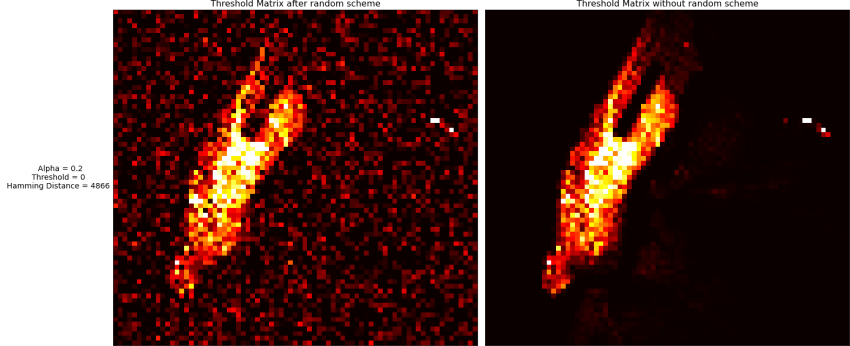

In [24]:
alpha = DiscreteSlider(name='alpha', options=[0.01,0.05,0.1,0.2,0.4], value=0.2)
threshold = pn.widgets.DiscreteSlider(name='threshold', options=[0,5000,10000,25000,40000], value=0)
n = DiscreteSlider(name='n', options=[6000000,8000000,10000000], value=10000000)

@pn.depends(alpha.param.value, threshold.param.value, n.param.value)
def graphData(alpha, threshold, n):
    return Image(filename=f'img/slider/ConsistantThreshold/N{int(n/1000000)}/Alpha{alpha}Thresh{int(threshold/1000)}kN{int(n/1000000)}.png')

@pn.depends(alpha.param.value, threshold.param.value, n.param.value)
def getE(alpha, threshold, n):
    return pn.pane.Str(f"Individuals are {round(2*math.log(1/(1-2*alpha)), 3)} distinguishable from uniform and thus \n {2*round(2*math.log(1/(1-2*alpha)),3)} locationally private.\n", sizing_mode='stretch_width')

@pn.depends(alpha.param.value, threshold.param.value, n.param.value)
def calculateP(alpha, threshold, n):
    t = threshold/math.sqrt(n)
    return pn.pane.Str(f"The probability that there are no false positives in the final\n matrix after the scheme is at least {pow(1-math.exp((-t**2*n)/((n/(2*alpha**2))-((2*t*math.sqrt(n))/3))), 77*71)}", sizing_mode='stretch_width')

gspec = pn.GridSpec(width=950, height=600)
gspec[0,    :2  ] = pn.Column('### Inputs', alpha, threshold, n, background="WhiteSmoke")
gspec[0,   2:4] = pn.Column('### Privacy', getE, calculateP, margin=0)
gspec[1:3,   :] = pn.Column(graphData)

gspec

The snipet of code below has a continuous slider for the threshold, but notice that $\alpha$ and $n$ don't have any sliders. This is because we already ran the code for a specific matrix and thus we can only chose to move the threshold. In the scenario in which you want to run the code for another kind of $\alpha$ or $n$, you can run the code right below. Note that running the code below can take up to multiple days on a regular PC. If you just want to use $\alpha=0.4$ and $n=10,000,000$, you can just use the preloaded `mat` and `finalMat`.

In [184]:
%%time
n= ...# Fill this with your n
alpha = ...# Fill this with your alpha
mat = discretizeSpace(-8220944, -8243208, 4985828, 4965256, 290)
finalMat = changeMatrix(mat, dfNewYork[:n])
_, _, mat = randomScheme(mat, alpha, n)

In [5]:
matHeatMap = np.array([[940,2302,9235,-3000,-4558,-1658,3220,7310,-1590,-2630,7848,-1518,830,535,-1495,-6188,-2572,-952,-3312,8300,5130,1452,8712,4675,-2072,1825,-3570,6180,-2525,-3180,-1885,1715,-2240,-2030,-852,548,-6372,4090,-4695,-5252,3970,2315,-7150,-3222,4315,7420,-10312,1118,-3418,-2950,-4422,7262,-2445,-3580,4135,-2070,2218,-235,1972,-5368,-658,-2462,625,-4618,1412,5535,-580,-3885,4270,-1688,1665,-1100,878,-3695,-8972,4058,1705,],[-4325,8182,2395,-195,2985,-1828,412,455,-3735,1162,-1318,5490,-1548,-18,10618,-2712,10700,2125,-22,4035,7255,1242,635,-3628,4048,-2575,-500,4372,-22,-4850,-1558,1015,4235,1150,2835,6680,-5,7462,-1095,-605,-3710,-2585,-2820,-2618,-1288,545,1398,-5720,4085,-4628,-3352,-4708,110,-1550,-2285,238,-2378,5742,2295,3215,-948,6010,1472,500,4208,5950,922,-3090,6762,-6340,3082,-5410,1510,198,-2570,1918,-10085,],[-272,-2650,-140,-595,3095,800,-512,315,-105,9312,-1328,-2110,92,335,-2745,-2348,-5328,-2018,-2922,-6925,1020,1015,-885,545,-1298,-408,-1640,4358,-1048,-8265,5825,3708,1678,-198,10832,12,1660,2002,-2322,-2828,4190,3078,-1755,-1278,915,-2440,430,35,-3242,235,2268,5538,-4060,-5610,-2888,4280,-3540,-2425,-3340,-1878,3352,-1630,4365,408,-2055,-4098,3548,-3282,8790,-2120,1180,3292,-822,-4740,-5782,5602,-3138,],[-1580,-4000,8272,4515,10,3245,4202,-58,1798,1500,6035,2602,-6748,-3080,1418,1660,10222,-530,-425,-942,3858,5050,8665,4938,1880,2538,-5005,-998,-972,-5012,255,5035,-2020,-1400,6690,-840,-470,648,-3648,1130,-280,2875,-752,1180,3102,-2810,1705,6925,1570,2530,-3708,2820,4120,3830,-290,-4750,2068,-2115,-2355,-2965,555,-3212,2428,7440,4698,-3900,-142,1625,-5372,2165,3480,3078,-1548,1692,165,-2028,650,],[2040,4200,-4202,-1658,-3055,5805,-3160,-4688,6828,3045,3970,4622,-1798,-2785,4078,-1750,-4082,-12458,-4325,595,3470,678,-2768,-9725,-268,2515,2335,7970,2962,2352,605,248,-120,3945,2955,-4622,4350,10608,2535,2020,1365,-5238,7250,-955,3210,-995,2772,4485,9185,-85,3468,-98,1020,2178,7012,-1928,1305,7398,-5705,3708,3315,3805,3245,2085,-1652,-3738,-3492,-9380,7905,1175,8620,-2410,-4422,3400,-2252,-860,-1535,],[-1538,-7980,-1182,2098,7008,1250,-2972,550,-2872,-5170,3602,2660,1715,-6055,1310,-3142,-1415,-2788,-42,-1180,1200,-3848,-1518,512,-6015,-3060,-1305,2918,-2722,388,-622,1522,-3062,-1362,18668,-202,-2815,8240,-628,1470,2462,788,5412,4655,8172,-558,6310,712,4690,1422,-2820,-242,-5058,-888,-142,3610,-445,-5745,-5265,1158,510,10100,1190,-4035,-2578,4888,-450,-2088,1330,4215,2030,-3348,2535,1152,-2640,418,-2405,],[-590,3372,-802,-2345,-11035,640,-292,-7370,1470,2425,-145,1990,-6880,1282,2285,-985,-4195,-5175,-2605,1482,1185,-625,4135,-150,1945,-800,-1152,-9135,3185,2830,5835,-95,11598,1020,9835,140,-198,3770,-2192,1878,-75,4628,6122,2488,-5065,-6500,-255,5778,-3605,3245,2878,1002,145,3845,-11790,610,4532,4755,-2608,3370,6860,4512,925,-1040,-6780,3645,1705,-1482,-3692,-6475,-2918,2930,648,1080,5042,-1268,-3098,],[4850,-2412,1082,3942,-4795,-2170,2522,6580,4670,5920,-1075,-162,-1558,-8318,-6428,6148,1312,-1202,3415,-3512,945,-10040,-4802,-3252,-1065,3290,-6420,2092,-490,6178,7242,8885,16795,12382,2065,-980,15985,6115,12470,-615,-3498,7632,18292,-3455,-6768,-3608,-6628,760,7452,11150,-3302,-1815,-4262,-4055,3288,-4005,580,-100,-2085,-3065,-2032,-3288,-2242,-2260,-2182,1748,1508,-2450,2250,2092,6438,3735,2730,-4620,-1268,9105,-5932,],[-10598,-3952,368,-3098,1168,1582,4005,-5230,3938,3900,-2448,3412,3480,120,-112,-1592,-4090,-145,6900,1305,6350,-4048,2608,-3792,-2212,832,50,3550,-3665,4150,1260,16310,6485,2610,4045,1940,10328,4768,-968,9620,8932,3760,5150,3425,-3252,-8830,-5358,-355,-202,2800,-202,3372,2368,-3220,112,5400,-9525,550,-9278,12050,-1408,-8678,-1960,1215,-4208,-990,-1118,-6068,-130,5215,4932,-7305,-5215,-418,1942,7635,-1725,],[-1348,-1048,4208,-1840,-1395,170,1582,-915,-252,3092,4345,4318,-3020,-1265,-2930,7202,5145,2212,-2715,-1700,1658,-5,-3312,2610,7112,710,-4515,-560,2925,1198,1702,19972,7598,-1348,4925,6555,4395,3365,13185,3808,478,-1688,-30,512,6738,5910,-7860,1095,2942,7095,2152,575,2005,5918,-4690,-8535,-4848,-3770,2080,-4172,4878,3270,-2978,5488,-112,798,-320,482,458,1018,2195,-4542,-1135,-7238,1950,-2065,5088,],[2365,2365,5515,-2122,3835,-2900,5728,-5230,2558,-2398,10,2260,4242,-645,348,7712,6370,2755,-3338,1832,-715,-160,5202,-6942,-6012,-4972,4915,700,-3618,-162,10740,19688,-848,11028,5118,-5468,4195,9152,-2850,5318,3412,2638,-5100,-4322,2445,-1508,-6645,-1995,-802,5025,-3810,-7538,4145,3248,-1540,385,-6062,8590,-1988,-2082,-2662,-350,-752,-162,-3712,-2838,3662,-3435,1968,-705,552,448,488,-9185,2062,-3482,-1598,],[-9492,-5710,-622,1050,445,3805,235,1262,-150,-1415,-735,-4142,2340,3620,-992,3085,-6358,-132,5305,-1445,-6080,7372,32,-615,-1685,4295,-4830,32,1850,8798,27185,6180,5688,2812,4432,-2668,-1810,-580,5818,3615,3732,-2702,982,3925,52,4718,7642,-4630,-3240,1208,2455,-6168,-4245,-3392,-2472,-470,-5320,-2198,-5000,-3415,-1045,-4230,3268,-415,-6242,1542,-572,2810,-5925,4440,1430,462,7130,1238,-1835,960,-3060,],[5530,-1105,-748,1065,2822,-945,1882,2835,-5605,9075,-4310,4988,2165,-6782,-11048,2558,392,4198,-1505,2575,402,6920,4478,4045,-5910,1152,370,4405,2178,20030,27820,7708,17380,16690,-82,4978,1875,4280,-672,9212,4290,2252,4010,4125,4640,6552,6715,-868,1442,455,-455,-4272,-1552,-4325,3360,1372,-4938,-1865,-3220,5058,-455,-218,300,2635,-1278,-7388,-2140,1572,1248,-2430,2380,8745,-4460,-6732,4762,2978,-4018,],[6318,2348,-668,-2440,-712,3332,-4525,-3988,2272,-2458,-798,-180,1648,-6090,168,545,-1870,-2715,-1660,-945,3688,6658,-1428,362,-3100,-2052,3545,2692,9882,24205,27820,28185,5700,3012,5612,3658,5362,3802,5095,2485,9580,-1475,1115,-7625,2138,-5482,-630,-3162,-5492,-2900,2282,-1935,12,-3062,1712,-3948,-2058,2432,4488,1348,1918,-4008,-6995,3045,2850,6535,-1982,182,3158,-7438,3528,-2170,-768,2948,-3578,8578,-6935,],[-8208,-230,-142,-298,2390,2788,2578,-1098,-865,-138,-390,298,1272,118,5795,1188,-5755,5942,-4262,2882,-1980,-6190,622,902,715,-1565,2992,2570,29848,29188,8080,23348,18225,2262,-2570,-3278,-3900,9060,3712,2620,8872,8358,4282,-7070,-2480,198,-765,2238,-688,-3242,2235,2192,15,-1105,-15,3428,2748,-850,862,1010,-470,4398,-2758,-772,2800,-3918,-2372,-3320,1392,-4952,5655,-3348,5932,590,-1430,1175,-4742,],[2950,5585,-3040,-422,4638,15,4572,-1535,1608,-2355,-690,-5270,-3315,-1382,3202,-7075,4848,-30,5048,-855,-5428,1735,6842,1952,-1678,-1048,7362,12212,31565,22022,19405,8442,9638,-2350,102,-2220,10188,15365,-3502,2505,2330,5495,5965,360,3965,2868,-755,1790,6982,-838,-2112,-6855,-3952,1565,1458,878,-562,730,7690,-9722,-222,5362,555,4178,2955,-2148,-8178,585,3670,-5792,8495,3852,6618,2135,6138,1025,62,],[1285,4650,-12202,-1380,-2865,2348,52,3098,-1522,2068,-3938,-4848,1445,-4238,-2165,1478,14235,-2515,4805,-4638,-2205,-5205,-4198,-8432,5260,-9872,6758,31398,47908,21572,18005,14308,2990,1315,-1468,-258,31348,14535,3808,975,2010,2595,-285,-6765,-5248,2150,-2995,-542,-1172,8,-240,-1825,-1242,-1360,5435,865,1168,2405,7350,-1218,1015,1018,-2412,-1618,7395,7960,-1478,-172,5665,-2330,-2448,5138,-725,-3425,-10780,845,2605,],[2148,-4250,1722,-535,5770,-2642,1520,-2235,-322,1370,-888,-1082,-3462,-1105,-1870,-1295,-1322,438,-2308,-1005,-2645,1352,1180,3815,242,2662,15102,31155,22945,31078,23080,16212,-2410,188,-8965,11235,23835,34125,27245,705,5410,10010,4462,-1592,-1232,-5312,3008,-1955,-835,3712,-3908,998,5438,-370,-3478,-4180,-6428,9202,-1090,3950,-522,985,7330,-455,-740,-1520,-3622,3350,5522,4958,992,-38,-5022,1965,-8750,-2782,13398,],[9250,598,-2855,7962,4468,5345,-7138,-3860,-3458,-1655,708,4072,-5418,630,3245,4468,-6538,-4630,-6735,-1860,-1290,-5502,3120,-1762,-2258,3260,28332,38858,9712,18005,17788,4792,-3465,1148,13360,33435,37800,45045,23598,10260,10235,-1398,-4138,2458,-2082,2925,-3555,490,-3728,-1415,-610,1102,-878,-2838,1222,1142,965,-7940,-1878,-4220,1512,-2748,4885,-2538,-2258,-975,2892,-7462,2215,310,-4960,-6440,610,4902,-4330,5312,4122,],[-1758,8385,4432,4810,1060,-8070,-6750,6532,-3615,1222,-238,-370,-5542,2812,11080,1118,3972,3882,-5715,-1370,-960,-632,-7222,-345,3890,17275,49942,16358,18215,17582,9218,-2930,5670,-5308,21150,38948,36015,35980,28588,21695,13640,-938,3095,-1542,732,352,-240,1280,-1492,3532,-6525,-842,622,1205,-4250,-710,-2888,1488,-168,1735,-2130,-5342,1742,182,662,-1602,1508,5292,-1765,3632,7788,-8845,-1465,1510,3395,-1690,-7582,],[638,-2908,2895,-2028,1125,4702,-900,6462,-9072,-6488,372,9860,-8578,3265,-2270,-1872,4468,760,988,2830,-6025,245,-3678,12840,12848,27655,48562,24312,17758,19605,-6072,1695,1565,36545,33262,36160,88418,32372,21465,27265,18755,2615,-2422,2588,6965,112,2402,-2362,-1112,9575,1868,990,-1060,-3305,-2212,-4500,-2530,4335,2612,7392,-3765,4585,322,1792,-102,1122,-2248,-1128,-4262,2622,1748,778,4360,-6482,1722,1010,4210,],[2080,-2262,5252,-7395,2608,-502,-2590,805,-4945,-445,4835,8,-698,10798,-3612,4228,5088,-8148,4062,5528,-1645,5225,8045,15462,18372,16085,38880,38032,8440,2782,2738,10132,8252,25720,26102,37850,48840,45710,28432,15195,11838,5442,1190,7570,1542,-585,-1612,828,-48,3302,-2668,-4485,1460,-3880,6445,4600,3348,865,1488,10708,1215,-640,5965,585,-5622,3022,1002,2715,-2532,912,-1445,-3050,1552,-4245,-5395,4330,5140,],[8412,6275,-4200,-940,3885,1452,-5300,-1748,4782,-1160,1602,-6335,1932,5428,-1250,-2280,-5312,-6790,-2160,4375,1245,-2120,8155,23065,10590,27790,38308,14825,15828,4178,2,-170,11682,45740,31922,31640,29390,29465,24538,30532,14970,1582,3530,1935,-2682,625,-5002,-1635,-2132,7140,1965,-160,-2165,855,-4462,1155,-1545,2650,2142,-5905,-5788,-1728,1060,1328,-1692,-1322,-3075,5018,-3348,-1240,-200,-3512,122,-1422,5252,-9075,5042,],[2668,-3972,5135,3525,5985,-8530,-4675,-532,2018,2770,3330,4252,860,2902,-2105,7358,4090,-6402,-618,2892,-1398,-840,12852,28272,6612,38845,63605,13532,208,-4582,-3810,2512,24505,53970,36098,41388,39700,29382,19688,20518,8482,-2342,5270,-582,-2935,-6300,-1648,1395,1842,-3188,48,-3380,565,-828,5420,1788,840,-2322,-4562,1955,2052,4075,4425,16600,-5590,-4825,-7005,75152,99818,-4332,8952,-2935,2042,-1015,-3950,412,-6548,],[-2555,5088,-1352,5050,-3280,-3665,-4405,7075,-885,-2585,-1072,-4505,3195,4510,5578,1648,-1002,3455,1010,2082,3255,2265,10898,6035,9040,42448,35800,14160,3695,-208,-3630,16645,26005,32538,38732,32465,33738,37862,38682,21758,-2828,-2715,-7605,1042,740,-3542,-1330,2058,6982,-5205,6045,-3980,5565,1940,298,-3418,-8472,-7660,-7542,848,1445,292,-7120,1452,1740,-7192,-695,5038,60,-3958,11340,5972,4350,-3650,-3195,2848,-2838,],[642,-7732,1175,3132,-6225,-5300,-408,-10,-3845,438,-1102,6470,-3245,-1062,-3715,-1170,1548,6842,-798,-5720,8755,4508,19195,28815,16630,33948,48835,8468,3030,5658,5192,17860,31150,29618,48152,34602,46578,26062,11720,1658,-2755,4905,2030,1052,962,6230,4395,1810,-2422,2080,-2912,2055,-1308,1265,-4302,2052,1300,6150,842,6860,102,1595,2020,-6550,-3285,-1120,802,790,2900,2760,8828,91242,-682,2402,-4505,-2028,2480,],[-4578,750,-2835,6588,350,5085,-362,-4610,1798,3312,9700,-2770,-2898,1240,3252,-485,-358,152,-10,-6950,4118,13405,7930,13262,35528,62128,62862,1248,472,70,15532,35930,32882,49720,21910,38605,50260,22095,3138,2348,-940,-2235,1372,-2980,-7030,-2632,-1560,6182,-2990,2932,5660,-5005,2275,5945,-485,9855,5328,-4552,1452,-3688,-6282,-938,-6890,-798,-2180,-70,-4445,1322,6935,4478,5810,1325,15505,5752,-3660,-2595,2625,],[1060,-2150,5495,2982,-118,-1928,-1562,-5588,1555,-3552,-872,3010,-1315,2405,5910,8258,5002,362,-2378,-7778,4592,7232,18695,19185,20302,44580,58232,44252,42910,15950,36322,45040,39972,36195,33642,27658,47705,26048,2190,-4795,-9152,2400,3432,4585,5840,3585,2688,4872,-622,3140,6005,-2575,-2,-655,550,440,-645,288,-2382,-4488,8135,2030,-8715,1212,-2085,-5320,8660,4415,-9705,-2728,3732,-4712,-160,-5955,6290,9080,6698,],[-3750,2922,9385,-688,905,1038,-5585,1370,-6682,7682,1718,-3938,3718,4675,-4048,4010,2062,1002,-1560,5198,25520,10055,14378,35635,31910,48790,73165,74902,52410,104190,68900,56945,42058,32012,19065,19190,44878,1998,-6515,4855,1318,1580,-2380,1342,-6628,3372,3848,-5560,-4652,-845,-2600,3772,-460,-598,3360,2730,932,-402,8840,-4900,-2160,1500,-2578,-978,418,-7822,-3685,-4080,-6328,-1518,4668,3235,-3250,-4298,-4192,-2288,3118,],[3000,3455,6800,3538,2935,-6535,-262,2312,3382,740,-5758,-3435,-7502,-2725,4058,10218,-382,6382,3830,20502,23680,25102,16825,22805,60400,
62892,43422,89740,52558,60115,68745,68505,46562,19800,26558,11925,-1865,140,3168,-1380,3622,7135,4650,1882,-3315,1538,3860,9550,3098,4885,-192,245,4688,-1490,-450,6818,-3392,-1920,-6675,4908,1070,540,-3515,5920,3565,-882,-1908,-255,-2552,1482,2012,-112,1005,4892,3918,-1750,3538,],[7030,252,-4265,-1298,785,4768,-3750,2968,1965,1278,6315,4440,2912,-2732,-3600,-848,-970,-2600,22182,9360,28925,23212,43882,44840,64250,72638,67245,37422,60910,75445,57648,43898,34808,24322,21575,6168,3460,8008,1260,108,1518,-3448,16680,325,-4490,3628,190,7768,465,4825,-2295,5292,205,882,3598,-430,-5240,-1242,228,-2735,-2358,-1008,5772,-4612,-2695,-5235,485,3778,1858,1205,1142,-5590,-1292,3398,-7882,2715,-3732,],[-265,-5332,-5905,642,-4640,560,-8130,-118,3180,-1208,610,5785,-540,-1450,-5142,1555,-4075,-1640,24368,15730,9480,24182,30002,77692,55170,35700,49322,60620,61178,66120,84345,44465,36088,36622,18715,2538,1532,3552,3670,2872,-740,5425,3532,-2650,872,2098,-1038,4492,-3502,8460,8160,2005,-2005,1330,-960,-8630,7170,-5848,-990,6060,5045,515,2238,3822,-1960,-158,1970,-3390,-2418,9170,-2782,-2625,-2185,-4428,-842,-6272,6005,],[1088,-2835,115,3870,4900,995,2722,-2092,1112,-7488,3812,2212,910,-1578,202,-4360,2742,-1388,23030,16485,25335,35980,114615,64912,66188,63312,39782,55585,89782,81525,57280,45695,40330,22752,3565,-4420,2562,2930,-3240,-4902,678,4202,-4390,318,-690,-3215,-4082,2668,3625,2910,-1812,-2880,-1468,-608,555,-3752,4370,602,-332,3505,-3425,-3900,11345,-2048,3345,-2448,6328,-2938,8378,2615,-8548,-750,7198,-4382,-1782,792,-2068,],[-2405,5900,1352,-2518,2990,-2578,-3002,-542,2715,-3985,-3122,6778,1028,-185,385,-3522,2900,5175,2830,10650,20110,22120,43298,31825,32485,34230,49388,78898,42372,52762,41935,31888,21255,3295,6790,-1285,2332,-665,2788,-2948,-3992,42,3365,-3492,4485,4112,-772,-4278,-2758,-882,4868,1060,2788,1162,1240,-1730,5598,-1152,3258,-2775,870,-3140,-3480,-1395,4685,-682,-5970,202,4345,-1338,3710,2448,4768,-2570,-3500,-348,-295,],[555,-1380,965,4802,-3422,5810,3822,-3760,848,-1158,3088,-1340,1765,7022,2372,40,10755,30662,9568,11055,10510,99400,42632,30698,49885,22300,48670,129565,116022,43782,33200,15078,2675,-3202,492,-1808,4678,738,-1332,-1475,5105,7052,6698,390,3220,-3360,9600,4125,-1795,3162,-548,1550,-2512,102,-7072,4535,-1502,2150,2680,3602,4040,1375,-6115,6592,-452,7990,-165,-5952,1505,-4150,1138,6930,-8918,160,1522,-3662,5298,],[-8852,218,-505,-3622,-6652,4715,3910,-1750,-2362,9385,-728,1790,-1560,2828,1198,-4212,6945,31810,26562,9690,14470,123180,272665,46728,38400,44280,36078,66908,57022,50060,31800,5060,4865,10995,-628,-1795,3545,-682,-4422,-6855,-970,-2148,-518,-3432,4020,-400,3615,-1818,3320,-4460,2050,615,-2608,-2000,958,5698,-9702,1708,-348,1530,1658,-4450,3178,3088,8165,4112,-498,-4312,-8860,-1618,2022,710,-2950,2562,-262,-3828,-3450,],[3512,1318,1202,-930,2935,280,335,-1100,7875,278,-1660,-755,6728,-3808,1965,-2000,15300,43225,17295,8890,18848,29955,50510,73932,52022,43302,43842,34800,47778,37785,13315,-440,2700,-200,-5860,3192,1988,-645,-15,2562,-208,-1125,-3602,-1712,800,1855,-3438,-2642,680,-3540,3865,-2062,1422,4475,110,8452,5160,4770,-2500,882,3748,-4240,-9560,1360,-3915,2425,-2415,-2172,5170,58,740,3348,2140,4875,-4872,6902,-3432,],[2060,730,-3265,-2622,4125,-1830,-252,10172,6478,4378,-1222,-302,-6135,-3655,2748,1868,7035,26370,32088,20252,19172,59492,38532,36348,49790,48680,63858,67345,18698,22148,19070,1172,-5652,3245,-1828,2008,1992,5790,-242,-3300,6812,-3788,5138,-1430,725,-1320,-3260,4085,2238,-100,-2770,-6365,5675,-78,2530,7785,1950,-4642,5305,2842,5892,-860,3118,-2940,400,-2202,-6265,-1028,-7508,1035,2788,2732,-4525,-2218,-2115,5735,-4828,],[-2438,-2648,802,-7010,2280,202,-972,-2638,-10832,-2518,-3312,-2065,5802,1912,-932,4918,43435,15388,13588,34420,37105,33535,59238,49538,57148,52205,47420,32465,42930,32030,3068,4140,-2375,-4785,-1515,-2582,-350,-970,-2675,2475,1382,5758,2235,5265,3930,1952,602,-3452,6432,6500,2180,4702,4622,4565,-5738,-332,2138,9130,-3282,-7328,-2272,-1322,4462,1372,3622,-8532,-2848,4630,-5730,-2060,1120,3220,-720,-490,-4788,6715,2065,],[-535,-1020,-7590,398,-1578,2528,1342,-2212,610,-4978,2555,1880,-4688,3658,1460,-2528,25355,72445,19938,12340,35465,61225,27940,48105,46228,49970,45888,30480,36265,2635,-3480,-3062,-3412,-208,-1465,-1132,3885,8450,3055,710,-7018,-2930,-2248,248,1518,-6088,3222,2165,3740,2032,-3948,1450,4622,-6040,720,-7502,-11492,8382,-1918,1345,-1300,7265,4600,-1935,10935,2552,1002,1018,-2008,1272,530,5890,-2745,822,6998,-380,-4752,],[442,1060,1145,-2362,-4628,-2580,5712,-2032,-3298,628,-7342,-2225,-3468,-2588,2042,8318,73995,43505,57568,31875,29130,56772,44198,40885,62128,28790,34000,21425,21988,-472,2862,3008,-1845,2795,-188,35,795,1862,-7752,1058,6512,1238,1315,-1522,1740,-5015,-278,7102,-1500,5158,4925,-4535,-3965,-2695,5720,8560,-268,1182,-1378,585,4592,2265,2178,-2155,5062,-3278,-10350,-1130,4580,2415,5098,1778,-4928,-1962,-285,3512,-732,],[-1710,-1465,8335,-3455,-50,415,125,3022,-4062,928,3275,-3310,875,5808,2252,16398,33435,32775,23358,34948,38902,17985,51992,63620,31700,39610,32190,15260,6815,10972,4595,10,-8548,-3175,1010,6270,-5198,-2338,-1282,-4498,-1818,2142,4258,5448,-1260,-3950,5170,2558,-115,-5702,4648,-778,-3055,238,2875,3475,1880,-4725,-3748,-2482,5145,288,695,-535,418,3922,-2002,3130,7868,-830,-618,3168,1038,-1235,-7285,680,-1472,],[-6310,-2182,-2055,-4992,412,368,970,-398,798,-850,-3118,-2470,3205,5235,-4760,4222,25300,20625,31050,6418,28982,40645,26262,51300,29418,19220,10165,25562,13650,10930,-1982,2758,-2048,332,3562,-9418,5885,220,5848,3458,-1598,38,1595,-6840,6825,-5285,-6705,6330,-4315,1732,-5135,4950,-5648,-4922,342,-3448,2365,362,5435,-5720,982,1032,-3045,160,-3748,-1855,4350,3788,192,3720,-1288,1485,-1192,-4408,-5090,-1368,-3195,],[3688,7155,1488,3752,-520,355,872,-2052,5238,11330,150,-3280,-11190,-4868,-4250,9220,31655,8282,44430,49735,7658,28665,54362,40378,29580,14735,24252,15145,9458,1318,-7710,-58,4548,6925,-2692,3762,-2008,3802,-2290,3222,-6412,-1480,-2275,-3028,-300,1018,3242,-4080,3410,-6350,1878,3892,-248,962,2325,5630,190,4982,-2758,-7820,3260,2412,-3730,6505,-4632,6635,942,-1998,-2402,-4255,-280,1228,5675,178,-5365,-4158,5185,],[4388,-1008,1928,3478,6445,-11805,745,-535,-990,1250,5345,-2810,-2925,-4468,2540,10650,38768,22992,26110,27875,35295,14985,34030,45275,31902,25462,17555,8775,16818,3162,2415,6848,280,-4008,1982,1528,565,4272,-280,2295,4422,-3745,-1308,1002,-355,-762,-782,-4178,-388,208,3042,810,2425,298,-1305,-9078,6245,-3162,6735,-4768,-12548,252,1012,3692,470,210,1332,-448,7310,558,-2665,-2562,-2580,6835,4862,3800,2885,],[-4125,295,2235,-3255,-2348,-248,1818,-3192,2805,-5238,-2742,-632,-6675,4028,1025,5682,25555,20038,50060,21515,11018,17725,40645,40265,38852,37765,20975,14982,4578,-1190,3048,-4658,-9088,3655,-1910,-3325,610,-4062,-3730,-5070,-6078,-718,-14100,2920,2692,200,-1205,7945,7930,-1445,6200,-2435,-3260,-1912,-8640,3482,-4072,-5262,-3228,-1288,1750,-6055,3635,2758,1140,3495,3590,-9420,318,3100,-2145,-3948,-2568,1030,-5542,968,-4418,],[-262,-2095,-2452,-6222,-7205,-815,10112,-5000,7515,1268,5,-3030,-1420,-2338,-3318,7832,11972,28855,44038,30858,12515,30050,26890,29578,37325,11550,25250,16512,7138,1435,8240,-605,2915,6565,1518,1060,4980,-2988,-1118,4392,-2305,-11182,-422,-302,765,142,5532,-4585,-3995,650,1540,5645,-5580,7250,-9332,-3822,3655,1682,-4918,-1298,-2902,-3260,872,-3898,-1475,-285,735,2592,6775,-4005,1770,5190,-6378,-4145,-948,-3190,2955,],[-1082,-168,-4348,9822,6512,-1732,-648,4102,5872,-4358,-2605,2272,5212,2878,980,13972,25262,33295,22732,25282,36590,32810,48540,33242,25595,27438,7590,17410,3158,3772,552,-4242,-4058,-6180,-1752,3662,1575,1802,-5775,-2618,-4085,-792,1100,-7332,-4718,-2955,-2402,-5570,9658,-2890,-6632,335,-465,2205,2802,2852,-225,7432,-858,-2628,-2708,1762,-4505,6800,-820,-1800,-7452,-15192,-615,-5370,2990,-3082,-3628,3042,1218,2198,-8262,],[-5438,3330,-1582,2652,-1155,-3242,3178,3962,1692,458,-8838,4440,-1692,6595,-1588,10140,14975,11755,23998,31612,48250,27780,38878,18322,13980,26425,15345,16630,4832,-2340,-1758,-1815,-6905,-1655,-998,2920,-8735,-978,-3715,10468,3032,-1180,7992,2432,-3552,1362,-1800,490,2498,-2585,-505,-1682,810,-9965,-3022,-2802,-1900,5740,5835,-5218,-922,8248,2292,1782,3355,1022,3318,-290,-3278,270,-2148,5242,-4625,860,6000,-2840,-3672,],[-1295,-202,3742,4782,-3682,1042,832,5995,1512,1898,8465,6728,3048,1058,-552,4705,15410,30872,16838,23315,37822,26530,12192,36800,38620,27210,6772,-788,9180,1100,-6720,-238,4510,-4505,-218,8535,-1618,2868,3042,6620,3048,3352,-4195,3422,11628,-388,4085,1982,2102,-4158,3068,-8035,-8140,-4668,1090,780,-288,-3352,-3010,-2770,5498,-2435,10235,-742,-4195,-4292,4370,-2655,-5165,5175,-1645,-4330,4820,2920,-2388,245,-1410,],[-792,5745,4280,4058,2240,3990,5290,2390,-2985,6552,4060,-6250,2925,7472,-358,55138,7070,25680,19870,20758,30525,32725,6092,41855,19010,6095,14132,5452,-5208,728,-5538,-7635,-3480,3895,-1080,5840,2970,-6910,2888,4948,-3818,1280,2872,4758,-768,-4168,792,-208,-3160,-2788,-822,-1218,-5462,4930,4840,-218,-4688,458,-6805,4305,-1675,-2308,3820,-2442,1085,610,2700,1818,-3365,-4562,1028,-6958,-2472,-3625,3815,-4542,3722,],[-1150,1632,-1608,702,-2452,-870,2890,
8730,-1608,-752,1512,482,5012,1255,5620,26075,5308,20908,20868,22388,12030,19392,26928,35175,26065,-58,-2450,6798,-285,-190,-3515,-5075,-1595,-225,550,7685,6355,1628,-3905,1310,165,-365,-4978,9085,2362,-4040,-692,-195,1812,-3295,-8350,440,3765,2365,-3805,-2462,-2442,-4770,1720,2830,-5218,-98,5115,-2995,2362,2235,3732,4645,3070,3348,8048,-1860,2962,395,2585,-9042,2510,],[-6662,-2770,-2835,155,-695,-6628,-818,2752,1895,-5940,-1608,-3905,6765,22925,14252,18215,16580,17288,6282,6335,10298,5048,6440,10805,-85,3588,1268,1372,-4672,792,-5730,7210,4315,3618,8288,8792,6638,3865,-1690,4522,-3248,-782,1152,655,-1390,-3915,-1322,-1372,940,852,-1028,-6862,1190,2915,-1160,-1058,-508,692,1105,-108,-75,802,-2320,-335,2002,-5702,4878,312,-3310,1035,3228,42,1228,-2328,318,1632,4918,],[1288,-2475,-7778,-495,6288,8012,-1700,6450,-188,-2112,8160,1872,9682,65298,13520,29200,12368,9798,7240,10200,8388,3465,14260,3060,1380,6210,9192,6822,-1708,-315,-1855,-262,5678,4185,2685,6002,1372,3440,40,-860,3850,4595,-3630,4515,-178,-3828,-3465,-2860,2315,5930,-1778,-5990,-4180,-288,62,-3750,1932,8395,-1832,-2510,2832,1088,-425,5995,2818,4952,3065,1130,4052,2028,-2008,-2652,-10470,-8655,-1140,-1068,-1998,],[-2478,4035,-12860,30,-4620,-5105,1032,7030,-3058,3910,-1660,10792,-3608,18280,4700,16668,19855,1392,3738,3162,5200,6440,758,4980,-3742,4265,688,2155,-3645,-2535,-7385,6800,3440,6262,462,1872,-1515,-3990,-1300,2488,50,7205,3550,-820,2168,2840,8020,1430,1602,-180,-1260,-5550,8448,-2375,2815,3855,-1550,-2525,-628,-4315,4675,-3098,5282,598,-3458,5015,-2255,5638,4788,-6668,228,-4088,-1110,630,-2738,-1112,4380,],[2975,588,-778,10360,-5022,2088,7518,9102,-9302,-7322,-3415,-6965,4838,35262,8375,29205,10390,14122,-5255,-1678,3982,-2330,5040,1312,-1695,470,2260,2535,870,5332,792,5285,-1480,4720,1368,6565,7905,-3622,11390,2748,368,-7252,2072,2178,11288,-822,1965,-7925,1565,-1022,4785,-6118,3720,2155,-448,2782,3865,-2965,-3260,-3618,4775,2920,5148,2102,4602,7888,2108,5498,2118,992,-3305,-5330,745,-2055,2920,-780,-115,],[-3055,-8150,1188,-1772,-1102,5248,-342,-870,-2690,1588,11015,-7375,19342,19838,18515,14952,20980,6408,12455,5212,1028,5570,3445,3828,672,4228,-2972,1140,5190,-388,2302,8622,-1415,-4285,1715,-2322,-2890,-758,-415,-2922,-372,2758,-3675,4198,-6120,372,5798,1845,4938,-6002,-1992,-800,1832,-218,2380,-6392,-2485,-802,5695,90,735,8140,-2370,-2178,45,2612,7628,-1788,6802,4465,-1368,-2490,1092,-2388,-4992,-6685,-3665,],[-1602,-6880,-52,-1405,-662,965,3052,6315,-3360,1615,5135,-1732,15552,8152,8998,18328,29832,19850,3248,4965,-1280,5045,3812,1275,265,-238,-5252,-1588,-870,-1995,3100,-2770,8028,-1925,4510,-6765,-3982,1638,-4702,6735,-592,-1030,2115,3718,1522,2848,-432,605,4385,445,-6655,2632,1240,-888,4348,-9270,-2292,4795,505,3000,3828,950,-2818,-1085,-3848,-7195,3992,-5842,-2362,4042,4180,-3405,3192,8408,-1698,4575,4110,],[9000,-2822,7062,1202,-2425,-2882,-7100,2985,-4902,-2958,-1415,-942,13980,11600,13388,23135,33515,2335,-2308,-1355,668,3542,-2375,7258,5580,-7995,-6378,-4998,-3108,3185,-1100,4920,4115,2890,-1712,720,10038,6262,-340,1698,1395,1485,-102,172,3608,-3255,-7028,-6602,-110,5532,-3440,-5485,-870,2390,-7572,-1465,1478,-1150,-1622,-2415,-622,-2425,-3975,4175,-552,4912,-2805,-425,3900,1368,190,4708,2310,5012,100,-5182,2310,],[4635,-1940,6328,1292,-2095,-5312,5082,-3970,3778,-9682,3135,-1712,-290,7560,36650,12368,678,4420,-2652,-408,-208,-2862,798,2450,-258,-3625,-2385,-1918,572,-445,-7332,2155,3430,2745,4400,1812,2982,-72,2840,-1948,-438,8238,1115,-2272,3955,-692,4000,-5930,-6072,3405,5238,-812,1978,-685,-3868,1520,2902,-4868,-3048,-762,-3405,-7702,-4338,-7338,-6538,812,-4018,4035,-752,-768,885,3052,-1022,1985,-2228,-960,595,],[5310,-2218,-315,-3050,2010,-2920,1342,1160,-3450,1078,-1222,1702,-192,-612,11785,2048,-1508,558,4058,-265,-145,-6245,185,468,1488,3650,-6200,-4282,1282,3588,-2758,1832,-2228,765,3472,-4502,-6945,-82,-940,1695,-5770,2642,3340,-1235,-5052,-2300,-1420,1938,1862,-5095,2210,-1572,1718,-5730,1715,8815,-1902,3128,-460,-4792,-580,4202,2595,7965,-50,1300,5272,3330,-6218,130,1860,-3252,-6262,350,-4145,-825,910,],[652,-4418,-1378,3530,-3752,-810,2350,-2455,6255,-5078,-1208,312,4675,2260,9185,-8518,4272,1632,4078,-2525,3888,-1178,4195,-1870,-6315,-4328,-2182,-68,-940,-1365,2155,3072,1452,5158,-4370,-3175,2600,5632,-140,1715,-3600,2402,4998,-5145,2952,-2180,58,9715,-9392,-3795,3492,-958,3112,9920,-532,-2335,35,-2232,-270,-3532,1195,-645,2960,3795,3708,1415,7025,-6075,9732,4882,705,5105,-1155,-2665,-172,2720,148,],[3452,-2538,-1960,2832,1240,5468,205,-168,2978,6585,-1655,-205,-3132,-2145,-2620,-1888,-1780,480,-1268,6462,832,235,5685,-3908,502,1202,-750,-3265,3780,4888,-3128,-1200,-3448,2810,-3190,-728,-2420,4005,6590,5882,1095,-4192,1775,-3195,1832,-568,-95,-5455,-5090,-635,1285,922,-2652,5480,180,940,-6748,-2012,2655,1738,-1580,-2272,-3275,-825,1340,2492,-315,2948,2682,-1342,-270,-2858,6180,3345,-1285,4955,-2700,],[-1718,-3645,968,4995,6012,-2372,1550,-4880,5068,-342,2412,-5375,445,1610,-3545,265,3635,4630,-865,3988,7128,-1235,-1348,3692,2940,13652,3635,-1995,6730,1942,500,-1740,-898,2460,8602,-5638,-1302,-6628,-1455,-665,-5410,-1872,5688,-9538,2938,5540,-365,10105,2662,3775,218,-422,1835,-6962,-2980,3118,-3288,1198,3280,3858,-4455,2780,8,2002,2670,1615,5302,-6232,-4552,4888,-45,-65,-1090,-2952,-4110,2870,2222,],[-1518,3530,820,-1382,-2718,-1420,-770,818,-4382,3012,2138,2000,675,-340,-4088,5500,9438,-1852,-1505,-5030,-930,2480,10010,3545,-2588,6558,2580,3040,7745,642,4340,-1735,9915,4238,4635,-1872,4950,2860,-818,-4442,2435,-6025,3810,-7435,-4722,1045,-68,-1508,-7768,1645,-368,-2900,430,-6340,5752,-3022,4558,-1815,9012,-3308,-305,-245,-9820,-6610,2588,-9518,-1142,1010,-298,-3345,-722,-148,3658,2572,9252,-6855,-2150,],[-2555,4010,-3590,50,-8932,-10,-1488,-792,1715,3118,-2280,2045,4310,5058,1288,-1765,2868,400,-1100,355,282,608,1528,1398,12908,-2350,3368,78,3175,-3145,-1075,2178,-5655,9445,-10395,245,-3680,-602,-1148,9475,-708,-6425,1930,-282,2105,-3420,-862,5168,-5945,2122,-2508,-4758,4628,-5408,1060,2435,228,1552,220,3048,-885,-342,-1060,-4165,112,312,-3818,-1782,2332,-4952,4128,3705,-142,482,3072,5005,-3972,],[-4145,-5482,-7268,2455,3562,-1855,-35,-2920,3700,-3938,3408,3178,-2670,7070,4710,1580,7672,8445,3625,-1090,-4288,-1362,9482,2825,-2930,3958,4362,1432,-4388,-4808,-4180,-1508,-2390,2645,10075,-2975,1225,2868,342,2560,7935,-4945,4518,-468,-1915,-7710,-200,-7818,1135,-1105,2765,2308,1398,-5958,2998,-182,-4590,-4642,-1652,-1342,5360,-388,458,6430,6655,-1498,-762,958,2905,7452,-1360,2380,-1610,-165,1248,-8415,8432,],[3845,-458,-855,-385,-1492,-432,-3342,342,-4795,765,5892,308,-4408,-4258,1830,-808,-2290,898,3638,-1622,-1168,678,-1718,-2085,4022,5182,2710,5828,7620,-4862,6385,352,-4842,2172,5790,3755,2692,6220,1832,-7352,-2390,-302,-1335,4148,5022,558,6828,640,-1478,1145,-950,-4088,2360,3695,-1562,-1190,-4225,-2605,990,1560,812,3635,-2702,6912,-6785,820,6980,-7312,1782,-2315,-2715,8078,7435,-908,-1078,938,-8758,],[-2215,5592,-10408,-1890,6740,-1512,2,-675,-2110,-3855,6108,3065,-3158,-358,2890,5292,-5045,1920,2998,1455,6778,6820,618,938,2645,-208,7785,3210,-330,-2055,8012,-1915,-2340,4615,-4540,-2638,7780,-1115,-52,1760,2798,148,1652,-5530,-3322,2758,732,7700,-4418,4005,-3690,-778,-4145,-685,-980,482,-272,-3168,1745,4088,2338,-508,-1988,-310,-2502,1648,-4485,3432,5285,-9138,-4480,-7972,-2378,-4712,3010,-1182,-58,],[-1225,465,3628,1300,-3368,1965,-3275,2762,-2048,4292,2285,-645,-915,4670,4105,-5288,45,972,4785,3155,4252,-6992,-5982,1470,980,-4808,5235,7840,10260,5460,2018,10360,8938,690,1298,-5575,4362,-5790,2120,-2275,-55,2088,-1270,30,-3455,-1645,3435,-1922,-1382,3528,-1778,-2660,-9300,1668,-3248,2742,7100,-5005,732,195,-3365,-630,-1818,2445,2525,-895,-182,-2425,998,-625,-1950,-545,-1405,880,-3980,-7498,-1730,],[685,2462,4852,-6852,-468,-5242,1668,288,-5290,3278,3128,2495,-3772,4325,75,2860,3995,855,182,-5012,3245,-2320,4362,1245,3555,-4610,2608,805,-1358,3345,-3302,5725,6545,1292,8942,5288,-858,1995,-8528,-375,9418,2035,2782,1620,2898,-1722,7070,10050,1955,-10082,-5172,3855,3870,10,-1558,-4172,7202,5905,2400,1075,-4382,-65,3852,-1882,1548,-348,480,-1165,-2020,6155,2018,4280,5962,-7522,-1758,1058,-2395,],])

In [6]:
finalHeatMap = np.array([[0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,1,0,0,0,0,0,8,3,1,0,1,0,2,0,0,1,0,0,9,581,1044,2494,1755,142,681,1319,1211,663,732,12,39,185,334,68,54,99,147,149,77,50,28,54,44,7,41,41,53,50,2,0,10,4,2,1,20,26,19,9,5,0,4,19,],[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,2,0,0,1,1,7,0,0,0,0,0,0,53,1409,1115,686,1091,90,1389,828,1914,1700,469,102,17,114,177,367,85,231,126,13,45,63,27,45,28,95,70,23,43,50,6,0,0,0,0,0,8,12,14,8,11,4,19,10,],[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,1,1,0,7,1,0,0,2,0,0,0,0,0,2,133,4721,3223,1039,711,420,1218,2064,1059,1671,1683,147,23,66,46,165,130,285,201,39,59,101,87,84,93,72,31,3,1,63,10,17,1,0,0,0,7,5,17,12,5,1,1,8,],[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,9,0,0,0,0,0,0,0,0,0,12,781,5256,1830,1328,1633,1436,660,1697,1995,1076,2307,117,122,271,170,147,220,114,96,39,73,103,88,87,76,23,3,4,44,23,15,1,0,0,0,0,0,0,12,14,5,13,1,0,],[0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,0,0,7,8,4,0,0,0,0,0,1,2,511,7144,4710,3664,1001,4922,1308,1097,1436,1756,2099,860,69,243,698,323,235,302,120,78,9,42,55,96,78,10,1,4,14,5,24,19,1,2,0,1,0,0,0,0,7,13,22,4,3,],[0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,2,0,0,0,0,0,9,3,13,2,0,0,0,0,0,17,1800,5620,7231,2241,1295,4679,2133,1638,3377,1068,1355,1062,73,74,226,190,607,203,102,94,78,42,67,6,21,0,1,3,2,3,4,11,6,8,1,12,1,0,0,0,0,3,17,7,2,],[0,0,0,0,0,0,0,0,2,0,0,0,2,1,0,3,0,0,2,4,5,2,7,14,1,0,0,0,0,0,2,1630,14362,5038,10169,800,2767,2714,2322,2220,4115,2174,1159,757,95,51,430,342,391,225,480,112,145,23,31,12,21,0,5,1,0,2,6,19,4,0,0,1,2,0,0,0,0,1,7,28,3,],[0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,3,3,1,6,2,0,0,0,0,0,15,3457,17384,12648,1939,2148,8286,2340,1433,2402,441,2200,16596,2977,376,32,1,242,95,85,122,107,119,32,14,10,1,2,1,0,0,0,1,3,0,10,2,1,2,3,0,0,0,0,0,1,8,],[0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,3,0,0,1,1,4,3,1,0,0,0,0,0,4,424,17985,9073,6689,419,5149,5839,3369,2815,1788,2521,781,2991,3618,1336,99,12,1,2,110,43,56,91,60,17,1,0,16,1,0,0,0,0,1,0,10,2,5,6,0,0,0,0,0,0,0,0,],[0,0,0,0,0,0,0,0,0,0,1,0,1,1,8,0,2,0,0,1,2,2,0,0,0,0,0,1,1,16,4245,21348,9245,4669,6480,7520,2946,1568,4794,3013,3444,1130,2221,2090,2791,320,56,0,0,6,26,49,38,48,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,],[0,0,0,0,0,0,1,0,1,1,0,0,0,0,1,0,1,6,0,0,7,1,0,0,0,1,1,0,25,2328,15566,17387,4859,11141,6026,2203,2874,4026,467,2321,2404,5281,3324,2722,899,519,111,40,59,2,9,4,32,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,],[0,0,0,0,0,0,0,3,0,0,2,1,0,1,0,7,1,0,1,9,2,8,0,0,25,0,0,2,69,6383,24780,6715,2448,4265,7043,1,2,2802,4837,2017,509,2505,4710,3130,3157,1048,76,0,44,46,35,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,2,2,0,0,0,0,],[0,0,0,0,0,0,0,0,0,0,0,0,2,3,0,0,4,2,5,0,2,2,0,0,0,0,0,10,2554,16743,26004,3427,15457,8029,865,4,2,18,5623,2279,4622,2572,2506,3094,3629,4161,50,0,19,88,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,2,2,0,0,0,0,0,],[0,0,0,6,0,0,0,0,0,0,0,1,0,0,3,1,3,3,8,3,4,0,0,0,0,3,13,166,12228,30151,17604,28200,10301,5018,1,3,2,2423,3484,1401,3529,5010,4331,1098,586,46,0,0,61,26,104,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,],[1,1,7,5,0,0,0,0,0,0,5,2,0,1,1,0,3,9,10,7,4,1,0,2,2,2,350,4977,22527,29202,6228,18089,17827,794,27,2,1735,14943,2260,4845,4180,4130,4350,495,12,0,3,20,19,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,2,6,],[3,11,9,2,0,0,1,0,0,0,19,0,3,6,1,1,4,12,44,28,2,0,0,1,2,7,4392,17470,30880,17015,20252,9272,15217,3,57,368,9778,17957,3938,6774,4106,4853,2070,36,0,5,15,58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,3,13,11,],[0,19,33,3,0,0,0,1,1,0,3,3,0,2,11,8,3,18,17,23,2,2,0,1,3,9,3921,32546,41788,15110,15486,19493,23,4,34,3169,30690,16093,6621,2437,6280,5143,375,29,1,20,38,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,5,],[0,39,57,5,0,0,1,3,0,0,4,7,1,3,1,14,41,1,10,3,1,1,0,3,8,860,16459,33434,22974,26757,23695,10446,21,8,7,11156,28317,28722,24733,4586,1870,5614,224,0,0,25,37,1,0,1,0,35,14,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11,4,8,],[1,9,13,0,0,3,0,0,0,0,2,2,1,2,0,2,12,22,5,2,0,2,1,2,22,4733,33282,41385,11168,22163,17121,113,169,34,9173,34638,38534,33296,23015,19172,3460,39,2,0,3,13,26,4,0,0,281,120,94,32,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,3,2,],[9,2,1,0,1,1,2,5,0,0,4,4,4,1,7,3,45,1,0,0,2,0,0,9,936,17211,55434,17976,19590,20904,8299,3,1,786,23529,40366,37463,31379,25665,15524,3232,1,0,1,7,1,33,5,0,7,310,405,302,117,27,2,2,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,],[1,2,1,2,1,1,2,0,2,2,0,9,7,5,14,37,10,0,0,1,3,1,4,9505,10977,21962,49129,15550,15814,15647,283,53,9,37282,33503,37564,87347,31720,23648,28981,16867,3,1,0,0,0,6,18,2,41,255,675,259,343,248,49,4,25,21,11,1,0,0,0,0,0,1,3,0,0,0,0,0,1,0,0,0,],[1,3,7,0,0,0,3,0,0,2,3,2,6,31,23,6,0,1,0,0,3,0,32,14718,17907,15118,39819,38814,14726,1770,2,85,1050,24631,29676,35152,51112,46124,23478,18866,13559,930,2,0,11,0,3,41,76,482,284,331,479,325,673,191,120,56,20,11,0,0,0,1,0,0,1,2,4,2,0,0,0,0,1,0,0,],[0,1,15,4,8,2,2,6,2,8,2,12,4,15,14,0,0,3,0,0,0,8,6520,17144,11243,30266,39660,12960,21384,8,12,17,10388,43046,39837,37920,32196,25291,27717,31824,11765,50,0,45,171,51,599,278,279,468,306,587,618,2349,660,299,377,96,13,0,80,0,2,4,0,3,3,59,52,4,0,1,1,2,0,0,0,],[0,0,2,16,1,5,5,7,3,6,2,6,6,13,17,2,0,0,0,0,1,63,3026,23987,6313,33972,58033,18995,557,9,11,1004,24060,55221,42758,41303,38467,30142,24514,21937,8733,10,0,67,148,305,353,702,732,673,803,497,970,408,992,442,388,96,76,32,56,8,203,9552,1,0,1070,82020,92943,1344,6,12,3,0,0,0,0,],[0,0,0,0,0,5,7,6,0,7,9,10,14,5,22,0,1,1,3,20,4,744,7036,10469,12895,44870,37258,16323,129,6,37,13089,29560,34173,49654,32772,29397,37761,37398,21964,255,3,3,0,204,279,207,2474,833,892,997,695,262,327,483,740,490,143,61,136,59,45,157,1195,0,66,650,524,1394,1352,7984,201,20,5,2,1,0,],[0,0,0,2,2,4,4,2,16,22,16,18,4,5,1,1,0,3,2,3,6362,4372,20241,29573,15009,33686,47267,93,162,360,2397,22062,28622,28704,49893,33813,41383,30546,8344,3124,396,105,0,26,477,358,1136,827,1233,528,1824,999,776,721,412,187,564,169,71,75,94,223,121,114,118,376,269,189,37,178,10356,92842,558,5,4,1,0,],[0,1,0,2,9,0,1,4,19,15,18,10,21,1,1,1,1,0,2,1,4908,11887,10253,21058,38485,66983,57564,5095,123,64,11368,31571,29433,49130,23571,37048,47191,23713,2095,5,52,33,79,216,444,508,1461,1566,1305,1899,840,501,805,1182,352,224,183,201,184,281,325,74,613,160,262,46,310,47,66,159,948,11953,18851,5,1,0,0,],[0,1,1,2,2,1,3,6,9,39,33,6,1,1,1,2,1,4,5,394,5344,10212,19783,13386,24213,52778,60267,40720,41372,15114,31036,38433,34545,39801,29968,34926,54809,23716,27,815,20,6,229,301,469,2189,530,2087,857,2028,2224,965,2020,390,566,115,40,0,9,86,387,206,175,37,48,37,92,33,11,33,40,57,25,6,6,0,0,],[4,3,0,1,0,3,2,3,13,24,15,2,1,5,0,2,1,4,14,4252,23636,10721,16738,35295,29949,53259,74294,79684,48332,99329,71123,58958,42730,33370,26636,24632,47755,2264,400,1016,6,77,293,2554,709,993,2149,856,1229,1619,321,1925,910,700,285,189,842,2,3,44,73,67,142,119,83,85,167,89,59,30,35,37,57,1,2,0,0,],[5,0,0,0,0,1,5,8,13,6,24,18,0,1,0,0,1,4,6363,24316,18809,24032,17912,21966,63354,67366,44713,89248,52217,59769,70334,75093,44043,24654,34174,11375,156,16,1380,29,5,200,235,561,731,1046,1134,3049,2307,747,1074,793,581,779,441,138,82,6,32,31,83,56,77,68,47,48,51,142,51,66,49,21,28,12,0,0,0,],[0,0,1,0,6,6,1,4,51,12,117,0,4,0,0,1,3,1412,26271,14024,25825,27800,42020,42207,66727,65802,65203,33795,70888,67344,55621,44763,35268,19433,23766,7997,20,615,20,2,41,239,274,1157,198,1456,832,959,992,1542,1501,775,655,272,483,242,10,46,110,59,62,65,106,98,58,95,64,72,36,40,37,26,45,31,9,5,1,],[4,7,2,0,5,2,0,0,15,1,34,4,0,3,1,1,2,1127,23670,18297,6102,26156,28644,72212,58895,37727,43229,60775,57283,66910,82398,44252,34323,36727,12147,250,147,351,1,98,189,129,437,284,802,736,907,1029,560,644,2140,1045,336,434,224,175,35,67,174,62,92,100,118,101,102,107,108,99,150,169,157,160,109,131,73,9,2,],[1,2,7,5,8,2,0,9,5,0,0,1,12,1,1,3,51,5054,25865,12619,21061,33766,114917,61948,60378,66727,35633,53372,88243,86736,59373,52176,32894,18482,3979,25,75,74,46,198,300,1151,239,727,423,512,1460,769,707,1570,730,538,942,113,354,125,167,98,127,53,84,234,681,832,710,565,368,250,120,58,62,48,45,40,26,14,0,],[2,6,1,1,2,1,10,70,108,90,10,1,0,0,0,3,437,3063,754,14821,22063,18770,40387,35490,31832,35007,48927,81391,42881,53129,34142,29683,24883,3556,9,22,3,33,334,313,270,4109,306,1138,1017,597,472,256,668,548,468,495,570,210,725,562,361,223,592,463,329,286,281,253,254,188,226,96,130,51,69,99,98,40,65,127,2,],[2,10,0,2,13,12,25,32,41,89,80,1,2,2,3,3,11488,33546,11096,3785,13029,92804,45653,32028,48796,23081,48030,135433,112200,42146,40432,14914,3990,26,8,6,4,77,181,452,6740,797,4579,379,1277,866,741,573,361,123,14,191,56,179,101,240,198,93,118,153,295,470,307,331,320,206,168,133,180,100,77,58,50,99,157,177,13,],[5,6,5,2,1,30,25,74,59,148,6,0,1,2,3,502,8265,25718,28924,10414,14898,115113,273188,44183,38898,43540,42232,65684,57117,49455,25714,8407,27,2,3,0,10,389,238,542,1050,808,3410,1455,200,32,1,8,5,16,143,107,77,147,32,78,204,230,364,271,321,502,507,532,309,317,232,167,83,374,88,236,143,129,26,25,14,],[2,1,9,10,11,41,22,106,37,11,1,0,1,2,10,2527,17692,41843,16105,9799,19595,29202,56212,78522,51079,43180,41524,31558,38003,43268,10945,418,4,3,1,4721,605,520,533,1582,934,2145,595,784,2,2,64,144,62,65,181,323,533,201,121,153,200,154,289,390,1090,577,777,1316,561,338,418,158,105,200,61,69,29,69,22,27,0,],[0,6,10,2,17,29,46,26,52,7,0,0,3,1,7,4973,
14168,20169,30448,20000,17870,54703,42443,38790,45095,47545,59101,55322,16021,23123,11419,34,8,3,1,3171,1239,930,366,999,1502,859,132,215,386,160,335,313,899,1021,1044,1055,1434,411,500,1110,1389,769,894,612,1626,1698,199,282,168,95,149,137,65,69,39,48,35,32,45,33,0,],[3,4,3,2,44,40,56,30,23,3,5,1,0,1,19,952,41176,14307,13322,32636,33874,28646,60178,53328,52247,61013,46558,34679,42256,32630,2629,6,2,4,760,2347,1321,1246,951,733,277,35,53,528,768,1130,934,2028,4995,3197,3090,1161,807,704,278,294,426,233,223,198,174,210,535,438,143,176,141,145,58,54,38,37,40,58,94,28,20,],[7,7,7,3,48,22,47,76,9,2,0,0,1,0,3,1420,31511,71132,21982,18488,37928,61084,38395,49285,51270,48543,45873,32717,36873,7380,28,4,1,1,358,836,2351,1631,431,206,45,75,21,268,518,79,84,368,796,1115,2171,778,235,300,708,940,713,388,147,225,136,158,104,195,391,210,94,142,102,54,82,16,20,46,49,76,11,],[5,3,22,40,25,66,67,64,166,1,0,0,1,1,10,8667,76819,47494,54864,29582,19455,57828,45661,42970,60334,29961,30807,24826,22261,2140,4,1,3,0,5,16,64,165,106,159,155,204,14,38,426,48,136,320,584,716,443,94,2,3,95,194,272,430,161,412,137,170,127,75,51,242,102,132,124,58,55,12,12,65,38,55,53,],[5,2,2,49,58,66,64,77,59,0,0,0,1,3,2,10271,25325,34156,19259,35629,38719,17528,55231,60395,38850,42277,35126,14804,3789,6276,7,4,0,1,1,17,406,91,1,0,3,37,89,94,126,82,309,326,395,373,367,8,1,1,120,207,119,120,112,61,22,94,301,180,230,143,261,150,140,75,49,108,213,95,64,75,74,],[3,1,1,50,34,19,69,73,28,0,0,0,1,0,4,5748,25067,15393,26268,13745,35875,44384,24150,48696,29772,22320,18197,26876,6129,4657,10,1,0,13,3,154,1231,241,101,0,0,1,13,359,174,101,188,102,320,199,132,17,15,33,72,83,72,68,57,76,7,11,23,27,145,294,525,123,86,83,282,217,145,159,114,81,94,],[1,4,16,3,15,4,0,0,7,0,0,1,0,1,3,8352,32083,17013,46275,53678,11873,31090,57185,52533,31231,17396,27817,11894,5871,15,3,1,0,1,89,1063,1387,856,81,1,3,16,41,96,4,0,2,2,63,61,148,2,8,8,9,4,16,99,40,79,62,63,21,51,103,82,57,257,456,258,213,339,234,127,57,50,70,],[1,3,25,27,56,7,3,1,0,1,2,0,0,5,2,6351,37528,30675,28378,25447,32166,24680,33378,42915,37976,26468,24417,3632,12544,2391,0,0,2,0,133,1197,1471,1024,40,25,111,97,2,17,2,8,0,16,16,55,74,2,0,1,2,0,12,95,65,73,52,44,27,50,30,19,135,55,131,163,129,125,115,220,154,70,122,],[0,12,15,45,36,70,89,15,0,0,0,1,1,0,250,8481,22993,20145,48655,26545,9902,20762,44202,39043,33247,31199,27035,15864,5765,2228,1,0,3,1,361,1828,1933,967,157,54,48,30,0,3,12,5,2,61,9,23,8,36,42,50,1,0,30,123,44,74,73,24,21,11,42,33,73,89,140,37,160,455,366,160,140,63,102,],[16,16,26,31,6,50,117,28,0,0,0,1,4,2,1463,7341,15337,26870,39400,30385,7390,31460,27084,29973,37236,22623,18091,12291,5173,39,43,2,0,0,116,516,607,998,879,257,251,149,22,7,6,12,17,31,7,38,13,1,1,33,72,54,31,113,85,81,99,50,42,31,44,56,61,69,134,44,60,111,260,268,189,155,238,],[11,13,8,11,14,71,100,51,1,1,0,1,0,2,100,9723,23556,35201,24218,26595,37142,30118,44819,32628,26198,32456,10921,11424,3648,567,6,0,1,1,0,585,613,1952,1048,746,732,872,464,81,23,23,6,9,2,7,7,1,66,9,96,74,50,87,65,146,98,79,63,4,19,34,80,44,89,89,36,44,86,271,122,522,161,],[54,18,12,11,9,250,1,0,1,0,0,7,0,2,893,7103,11494,21083,22569,26953,52854,31618,38346,16966,18622,20157,13833,15261,3619,431,1,0,0,0,0,194,211,1294,1999,1361,329,538,581,128,20,5,1,0,0,10,3,1,14,12,20,84,40,64,64,105,63,44,47,14,56,72,13,28,45,75,85,12,20,74,194,159,217,],[12,15,37,21,2,101,9,0,1,2,14,33,0,3,1943,12856,15762,31495,13785,27470,37143,23758,10689,41704,44348,24782,8187,4287,2507,310,0,2,0,3,355,3395,443,522,1388,1061,641,1068,345,118,3,0,0,0,0,4,13,3,22,15,51,81,52,32,0,16,49,26,22,57,39,26,35,26,24,94,98,40,18,55,102,106,159,],[35,23,72,43,47,24,130,2,0,2,1,0,3,7,1339,49107,8229,28267,16666,23558,27065,35075,8587,41233,21714,11317,7337,7542,782,19,0,0,723,1868,1506,2161,2152,174,112,509,798,913,102,15,0,0,0,1,1,1,1,0,5,23,50,79,77,17,9,7,45,76,34,1,3,1,5,31,22,30,30,54,11,25,128,61,99,],[11,12,29,92,37,41,28,0,0,3,0,3,31,6786,1914,24941,11493,22040,15369,16614,11425,14026,22716,38113,15424,3648,1239,1516,2517,5,0,1,1334,3010,2152,3904,2285,1350,1004,585,1088,692,174,46,11,15,16,3,4,6,25,3,18,15,18,44,53,18,3,10,55,25,15,10,40,36,27,33,23,5,1,31,13,18,46,59,76,],[16,19,45,39,46,52,155,1,1,3,3,2,2286,20629,18775,19294,20549,16521,7537,7696,12789,3362,8800,6236,2331,1241,1530,778,587,1,0,3,989,2612,2468,3281,1657,1192,1015,742,840,996,495,60,52,2,3,2,2,5,2,3,20,27,28,20,89,26,27,1,8,15,50,27,17,21,18,16,9,0,0,0,42,25,55,46,26,],[15,18,50,37,54,160,5,0,4,0,1,0,4846,66712,21536,24274,18157,7009,8010,7652,8814,4272,15759,4924,3034,2719,3798,2668,337,56,2,231,1666,2165,3063,2708,2098,3303,2169,952,1677,1054,678,354,393,46,42,16,10,31,13,9,58,55,28,47,41,99,27,3,0,0,19,35,26,28,17,25,5,6,0,0,9,37,29,19,13,],[0,2,5,22,34,116,14,0,0,1,1,4,593,16865,6181,21682,15669,6425,31,3578,3242,3081,2511,1238,1023,517,845,2530,3,12,102,509,2587,3244,1697,5056,557,1436,782,401,1156,1551,508,233,194,0,9,4,2,2,59,26,30,81,62,188,70,82,37,35,5,15,31,37,23,48,45,38,39,3,3,8,47,46,28,27,9,],[0,0,0,5,0,0,1,0,0,3,0,10,9348,35635,6102,26182,11068,6406,1633,621,1053,730,445,1400,909,1485,319,20,1,0,1,1671,2937,5346,2880,2642,1402,2357,2491,1742,953,150,208,395,196,3,11,5,10,18,46,41,6,42,90,85,48,138,23,25,17,2,1,0,0,4,24,32,23,4,9,14,29,13,43,54,47,],[1,0,0,8,1,0,0,0,0,1,2,8,12928,18255,16953,13498,17216,12278,6677,697,588,121,42,3,0,2,7,0,0,0,1,882,373,671,2033,1685,1490,775,939,703,1006,744,1165,134,94,153,24,126,281,367,53,133,114,140,88,111,77,42,198,54,3,0,0,0,0,0,26,25,14,13,21,23,19,6,3,31,9,],[0,0,1,0,4,0,0,0,0,1,0,3,9670,4240,13446,17762,25915,25514,1859,39,25,3,6,49,0,0,0,0,0,0,3,521,414,232,406,273,1340,803,1053,565,734,937,774,230,193,606,211,116,869,426,106,82,102,156,127,106,79,85,183,40,16,2,1,19,2,5,2,17,8,8,17,1,4,5,27,1,3,],[1,1,0,0,1,0,2,0,1,1,0,5,14782,11435,13775,25223,34279,1816,9,4,23,175,38,213,732,49,4,0,0,5,21,57,155,257,268,209,107,80,474,375,176,530,342,166,845,498,521,331,261,285,363,201,206,210,135,133,106,48,88,138,24,26,10,30,27,22,18,14,16,24,28,27,21,24,44,3,0,],[0,0,0,0,0,0,0,0,1,1,1,3,15,6912,31206,11009,2682,10,3,4,5,1849,3356,4056,2657,1516,230,8,3,0,0,53,56,59,268,199,117,105,96,244,572,289,25,301,290,364,785,635,231,341,296,235,209,189,193,191,110,84,71,103,22,31,34,25,29,35,40,12,14,21,9,4,11,16,38,6,0,],[0,0,0,0,0,1,2,2,0,0,0,0,0,109,6338,247,4,3,0,1,48,975,1198,2401,913,758,156,6,1,4,2,101,0,75,187,261,211,116,110,130,351,1172,487,229,33,124,664,484,650,384,322,293,185,135,126,127,81,147,114,64,41,40,52,45,21,9,5,0,0,1,0,0,0,0,16,17,3,],[0,0,0,0,0,0,0,0,0,0,0,0,1,0,4,49,2,1,0,0,695,2500,1896,182,249,511,240,38,236,116,97,188,10,77,203,370,90,326,133,355,191,164,731,694,707,351,567,610,536,374,383,307,422,273,244,20,77,84,23,28,58,28,5,0,0,0,0,0,0,2,0,0,0,0,0,13,34,],[0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,0,0,5,1299,2360,2034,1703,2048,3752,287,268,507,485,305,585,303,112,149,332,75,184,215,144,256,195,111,1515,1440,1268,430,152,217,156,95,50,71,99,86,111,58,50,11,16,24,11,4,0,0,0,0,0,0,2,3,0,2,44,22,33,10,],[0,0,0,0,0,0,1,2,0,0,0,0,0,0,2,2,1,10,0,436,2094,2801,3452,718,813,4730,68,86,210,424,515,908,546,522,533,372,808,567,640,543,375,304,244,203,454,1004,492,313,275,195,127,80,178,187,174,165,75,7,23,9,3,4,2,0,0,1,0,1,0,8,33,16,28,36,16,55,32,],[0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12,1590,1506,3235,2350,3740,2364,4409,589,698,249,1343,1899,2042,1132,832,478,135,517,379,411,493,406,465,390,302,292,323,468,344,471,205,139,102,174,216,108,153,54,4,8,13,0,0,0,1,0,1,0,0,0,15,34,42,46,26,41,62,33,],[0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,4,0,1,259,2704,2872,2582,2801,980,1420,2411,410,3,506,611,358,700,141,984,531,821,393,190,173,367,348,269,424,313,282,193,274,294,346,147,215,186,158,191,137,59,1,0,0,0,1,1,0,0,0,2,0,3,14,35,15,32,30,26,14,30,],[0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,259,844,1116,1737,2568,2394,1592,533,3258,1435,686,1430,1347,1474,824,484,511,506,899,800,146,129,245,246,193,163,173,219,185,172,225,316,312,330,220,92,142,87,1,0,0,0,0,4,0,0,0,0,7,8,4,20,13,7,11,29,34,12,16,],[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,13,454,1067,2131,1276,2094,890,1618,1212,604,1317,1807,1420,827,719,650,614,571,689,715,348,663,283,462,188,272,205,159,128,282,172,372,218,271,381,368,65,153,25,0,0,0,1,2,0,0,0,2,3,8,26,16,14,12,12,11,23,20,12,17,],[0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,128,992,1151,1289,901,1621,534,504,604,1133,3860,343,620,457,729,593,415,447,566,507,188,599,229,461,388,328,206,231,232,252,141,191,135,143,248,197,231,111,8,0,0,0,1,0,0,1,2,15,12,11,14,12,40,10,33,22,15,5,24,19,],[0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,64,514,410,1936,2136,1169,606,200,268,357,999,1478,2582,317,168,798,1033,832,366,239,540,307,456,412,377,323,265,214,274,192,279,177,140,138,124,105,118,171,219,83,24,0,0,8,17,14,15,10,21,18,32,7,25,14,7,9,18,16,3,12,8,],[0,0,0,0,0,0,0,1,0,0,0,0,0,3,3,126,121,303,521,1595,1031,1097,488,181,76,552,1124,916,1834,344,227,525,671,406,278,568,480,453,655,383,320,148,164,166,157,203,224,90,59,129,184,77,62,116,62,36,11,0,1,36,34,4,36,25,14,17,12,5,26,29,12,16,17,14,14,8,13,],])

In [7]:
n = int(10e6)
alpha=0.4
print('Note that for the sliders below, yu can enter any specific values directly in the box rather than slide to it. \nAdditionally, note that \u03D5 has to be greater than or equal to the threshold for a meaningfull probability q.')
@interact(threshold=widgets.IntSlider(min=0, max=50000, step=10, continuous_update=False), alpha=fixed(alpha), phi=widgets.IntSlider(min=0, max=1000, step=5, continuous_update=False), mat=fixed(matHeatMap), finalMat=fixed(finalHeatMap))
def getHeatmap(threshold, alpha, phi, mat, finalMat, show=True):
    
    cap = (findMax(mat, finalMat)*alpha/2)
    
    # Setting dimmensions of graph 
    plt.rcParams["figure.figsize"] = (18,11)

    # Colormap
    cmap = plt.get_cmap("hot")

    # Creating the plots and axis

    fig, ax = plt.subplots(1,2,sharey = True)
    ax1, ax2 = ax
    fig.suptitle("\nThe heatmaps based on number of people", fontsize=25)
    fig.tight_layout()
    fig.subplots_adjust(top=0.85)
    
    # Getting the matrices
    data_rand = np.copy(mat)
    data = np.copy(finalMat)
    data_rand[data_rand < threshold] = 0
    data[data < threshold] = 0


    # Getting the boundaries
    intervals = int((cap-threshold-1)/241)
    bounds = np.arange(threshold-1,cap,intervals)

    # For plot 1(left)
    norm = colors.BoundaryNorm(bounds, cmap.N)

    ax1.imshow(data_rand, cmap=cmap, norm=norm)

    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    ax1.set_title("Threshold Matrix after random scheme", fontsize=16)
    t = "Alpha = "+ str(alpha) + "  \n Threshold = " + str(threshold)+""
    ax1.text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=ax1.transAxes)

    #For plot 2(right)
    ax2.imshow(data, cmap=cmap, norm=norm)

    ax2.get_xaxis().set_visible(False)
    ax2.get_yaxis().set_visible(False)
    ax2.set_title("Threshold Matrix without random scheme", fontsize=16)
    
    t = threshold/math.sqrt(n)
    if phi<threshold:
        txt="The image on the left is 2\u03B5 = "+str(2*round(2*math.log(1/(1-2*alpha)), 3))+f" differential private, since \u03B1=0.4. The probability, p, that there are no false positives in the leftmost image \n is {round(pow(1-math.exp((-t**2*n)/((n/(2*alpha**2))-((2*t*math.sqrt(n))/3))), 77*71), 5)}. Finally, the probability, q, that all the places that were visited by at least \u03D5={phi} is not accurate since \u03D5 is less than the threshold. \nIncrease \u03D5 to get an accurate probability."
    else:
        txt="The image on the left is 2\u03B5 = "+str(2*round(2*math.log(1/(1-2*alpha)), 3))+f" differential private, since \u03B1=0.4. The probability, p, that there are no false positives in the leftmost image \n is {round(pow(1-math.exp((-t**2*n)/((n/(2*alpha**2))-((2*t*math.sqrt(n))/3))), 77*71), 5)}. Finally, the probability, q, that all the places that were visited by at least \u03D5={phi} users appears in the thresholded map is at least {round(pow(1-math.exp(-(phi-t*math.sqrt(n))**2/((n/(2*alpha**2))-(2*phi/3)-((4*t*math.sqrt(n))/3))), 77*71),5)}"
    plt.figtext(0.5, 0.0, txt, wrap=True, horizontalalignment='center', fontsize=18)
    
    plt.show()

Note that for the sliders below, yu can enter any specific values directly in the box rather than slide to it. 
Additionally, note that ϕ has to be greater than or equal to the threshold for a meaningfull probability q.


interactive(children=(IntSlider(value=0, continuous_update=False, description='threshold', max=50000, step=10)…

 The next snipet code shows how a User looks before and after the encoding. Note that since the encoded matrix has values -1 and 1, -1 will be represented in white and 1 will be represented in blue while in the original matrix the location of the pickup and dropoff locations are shown in blue. 

In [ ]:
mat = partitionMap(-8220944, -8243208, 4985828, 4965256, 290)
@interact(User=widgets.IntSlider(min=0,max=len(dfNewYork.index)-1,step=1, continuous_update=False), alpha = widgets.FloatSlider(min=0,max=0.5,step=0.01, continuous_update=False))
def userBeforeAfter(User, alpha, show=True):
    # Get the matrix locations
    x=User
    pickup_x, pickup_y, dropoff_x, dropoff_y = dfNewYork.loc[x]['Pickup X'], dfNewYork.loc[x]['Pickup Y'], dfNewYork.loc[x]['Dropoff X'], dfNewYork.loc[x]['Dropoff Y']
    if (pickup_x<mat[0][0] and pickup_x>mat[0][1] and pickup_y< mat[0][2] and pickup_y>mat[0][3]) and (dropoff_x<mat[0][0] and dropoff_x>mat[0][1] and dropoff_y< mat[0][2] and dropoff_y>mat[0][3]):
        pickup_i = math.floor((pickup_x-mat[0][1])/mat[0][4])
        pickup_j = math.floor((mat[0][2]-pickup_y)/mat[0][4])
        dropoff_i = math.floor((dropoff_x-mat[0][1])/mat[0][4])
        dropoff_j = math.floor((mat[0][2]-dropoff_y)/mat[0][4])
        
        # Making the mat after the scheme
        tempMat1 = np.ones((len(mat[1]), len(mat[1][1])), dtype = np.int8) 
        for i in range(len(tempMat1)):
            for j in range(len(tempMat1[1])):
                if random.random()<0.5:
                    tempMat1[i][j]=-1
        if pickup_i==dropoff_i and dropoff_i==dropoff_j:
            if random.random()<0.5+alpha:
                tempMat1[pickup_j][pickup_i] = 1
            else:
                tempMat1[pickup_j][pickup_i] = -1
        else: 
            if random.random()<0.5+alpha:
                tempMat1[pickup_j][pickup_i] = 1
            else:
                tempMat1[pickup_j][pickup_i] = -1

            if random.random()<0.5+alpha:
                tempMat1[dropoff_j][dropoff_i] = 1
            else:
                tempMat1[dropoff_j][dropoff_i] = -1
        
        #Making mat before scheme
        tempMat2 = np.zeros((len(mat[1]), len(mat[1][1])), dtype = np.uint8)
        tempMat2[pickup_j][pickup_i] = 1
        tempMat2[dropoff_j][dropoff_i] = 1
        
        # Setting dimmensions of graph 
        plt.rcParams["figure.figsize"] = (22,11)

        # Creating the plots and axis
        fig, axs = plt.subplots(1,2,sharey = True)
        fig.suptitle("\nThe blue maps of three randomly chosen individuals", fontsize=25)
        fig.tight_layout()
        fig.subplots_adjust(top=0.85)


        # Settings
        cmap = colors.ListedColormap(["white", 'blue'])
        bounds = (-1,1,10)
        norm = colors.BoundaryNorm(bounds, cmap.N)

        #Set legend
        t = "Alpha = "+ str(alpha)
        
        axs[0].text(-.01, .5, t, va='center', ha='right', fontsize=14, transform=axs[0].transAxes)
        
        axs[0].imshow(tempMat2, cmap=cmap, norm=norm)

        axs[0].get_xaxis().set_visible(False)
        axs[0].get_yaxis().set_visible(False)
        axs[0].set_title("Initial matrix for individual "+str(x), fontsize=16)
        
        # For the right image 
        axs[1].imshow(tempMat1, cmap=cmap, norm=norm)

        axs[1].get_xaxis().set_visible(False)
        axs[1].get_yaxis().set_visible(False)
        axs[1].set_title("Encoded matrix for individual "+str(x), fontsize=16)

        #Showing final plot
        if show:
            return plt.show()

[Back to top](#000-0)